In [133]:
import pandas as pd
import numpy as np
from ast import literal_eval
import warnings
import re

from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm

warnings.filterwarnings('ignore')

In [30]:
# list 형식이 문자열로 인식이 되는 문제가 있다.
df = pd.read_csv('./musinsa_data.csv', converters={"data": literal_eval, "label" : literal_eval})          

In [34]:
df = df[(df['rating_num'] > 33)]

In [35]:
df

,Unnamed: 0,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,...,coordi,age18,age19_23,age24_28,age29_33,age34_39,age40,man,woman,img
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,"['스트릿', '스포츠', '캐주얼']",32%,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...
1,1,THINK PACK,가방,백팩,YALE,YB1BG0031BK0,"['백팩', '노트북백팩', '백팩추천', '데일리백', '코듀라', '로고', '...","119,000원",4.9,3184.0,...,['캐주얼'],41%,27%,16%,5%,2%,9%,43%,57%,https://image.msscdn.net/images/goods_img/2021...
2,2,메쉬 스트링 백팩 블랙,가방,백팩,NEIKIDNIS,NBP005-101,"['메쉬스트링백팩', '스트링백팩', 'MESHSTRINGBACKPACK', '코듀...","69,000원",4.9,3733.0,...,['캐주얼'],42%,25%,16%,5%,2%,10%,44%,56%,https://image.msscdn.net/images/goods_img/2020...
3,3,앱솔루트 백팩 블랙,가방,백팩,NEIKIDNIS,037ASB06,"['백팩', '앱솔루트', '학생가방', '코듀라', '포켓', '노트북', '커플...","94,000원",4.8,12697.0,...,['캐주얼'],44%,18%,16%,8%,3%,11%,48%,52%,https://image.msscdn.net/images/goods_img/2017...
4,4,슈퍼브레이크 BLACK,가방,백팩,JANSPORT,JS0A4QUT008,"['슈퍼브레이크', '백팩', '가방', '데일리', '여행', '아웃도어', '포켓']","49,000원",4.8,3823.0,...,['캐주얼'],41%,28%,15%,6%,3%,7%,23%,77%,https://image.msscdn.net/images/goods_img/2020...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65546,7074,Comfortable Check Jogger Pants_Beige,바지,트레이닝/조거 팬츠,ELLIOTI,EPT003A4BE,"['밴딩팬츠', '체크팬츠', '일자팬츠', '와이드팬츠', '체크바지']","45,000원",4.8,147.0,...,['캐주얼'],24%,23%,19%,18%,7%,9%,67%,33%,https://image.msscdn.net/images/goods_img/2021...
65547,7075,헤비웨이트 스웨트 팬츠 [크림],바지,트레이닝/조거 팬츠,MUSINSA STANDARD,MMJPK611-CR,"['스웨트컬렉션', '이지웨어', '트레이닝복', '운동복', '원마일웨어', '스...","33,900원",4.8,8807.0,...,['캐주얼'],15%,25%,22%,16%,10%,12%,71%,29%,https://image.msscdn.net/images/goods_img/2021...
65548,7076,카고 조거 팬츠 (올리브),바지,트레이닝/조거 팬츠,URBANSTOFF,U203-B501OV,"['카고팬츠', '조거팬츠', '카고조거팬츠', '코튼팬츠', '밴딩팬츠', '와이...","68,000원",4.7,177.0,...,['캐주얼'],13%,18%,23%,18%,12%,16%,85%,15%,https://image.msscdn.net/images/goods_img/2020...
65549,7077,마일 기모 벌룬 스웨트팬츠 그레이 DELP4444,바지,트레이닝/조거 팬츠,PERSTEP,2161826,"['팬츠', '스웨트팬츠', '긴바지', '바지', '스웻팬츠', '밴딩팬츠']","39,800원",4.8,205.0,...,NaN,21%,31%,29%,10%,3%,6%,77%,23%,https://image.msscdn.net/images/goods_img/2021...


In [225]:
df.describe()

,Unnamed: 0,rating,rating_num
count,65551.000000,52032.000000,52032.000000
mean,5222.410459,4.764929,1488.128017
std,4389.373415,0.289849,8617.188022
min,0.000000,1.000000,1.000000
25%,1820.000000,4.700000,7.000000
50%,4112.000000,4.800000,33.000000
75%,7243.000000,4.900000,236.000000
max,18470.000000,5.000000,159414.000000


In [226]:
# from sklearn.preprocessing import MultiLabelBinarizer

# # dense solution
# mlb = MultiLabelBinarizer()
# df = df.join(pd.DataFrame(mlb.fit_transform(df.pop('coordi')),
#                           columns=mlb.classes_,
#                           index=df.index))


In [227]:
print(df.columns)

Index(['Unnamed: 0', 'name', 'main_category', 'sub_category', 'brand',
       'number', 'tags', 'price', 'rating', 'rating_num', 'season', 'gender',
       'like', 'view', 'sale', 'coordi', 'age18', 'age19_23', 'age24_28',
       'age29_33', 'age34_39', 'age40', 'man', 'woman', 'img'],
      dtype='object')


In [228]:
df.isnull().sum()

Unnamed: 0           0
name                 0
main_category        0
sub_category         0
brand                0
number               3
tags                 0
price                0
rating           13519
rating_num       13519
season            9066
gender               0
like                 0
view             19586
sale             31253
coordi           44945
age18            19586
age19_23         19586
age24_28         19586
age29_33         19586
age34_39         19586
age40            19586
man              19586
woman            19586
img                  0
dtype: int64

In [229]:
display(df.coordi.isnull().sum())
display(df.tags.isnull().sum())

44945

0

In [230]:
df.coordi = df.coordi.fillna('[]')

In [231]:
df.head()

,Unnamed: 0,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,...,coordi,age18,age19_23,age24_28,age29_33,age34_39,age40,man,woman,img
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,"['스트릿', '스포츠', '캐주얼']",32%,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...
1,1,THINK PACK,가방,백팩,YALE,YB1BG0031BK0,"['백팩', '노트북백팩', '백팩추천', '데일리백', '코듀라', '로고', '...","119,000원",4.9,3184.0,...,['캐주얼'],41%,27%,16%,5%,2%,9%,43%,57%,https://image.msscdn.net/images/goods_img/2021...
2,2,메쉬 스트링 백팩 블랙,가방,백팩,NEIKIDNIS,NBP005-101,"['메쉬스트링백팩', '스트링백팩', 'MESHSTRINGBACKPACK', '코듀...","69,000원",4.9,3733.0,...,['캐주얼'],42%,25%,16%,5%,2%,10%,44%,56%,https://image.msscdn.net/images/goods_img/2020...
3,3,앱솔루트 백팩 블랙,가방,백팩,NEIKIDNIS,037ASB06,"['백팩', '앱솔루트', '학생가방', '코듀라', '포켓', '노트북', '커플...","94,000원",4.8,12697.0,...,['캐주얼'],44%,18%,16%,8%,3%,11%,48%,52%,https://image.msscdn.net/images/goods_img/2017...
4,4,슈퍼브레이크 BLACK,가방,백팩,JANSPORT,JS0A4QUT008,"['슈퍼브레이크', '백팩', '가방', '데일리', '여행', '아웃도어', '포켓']","49,000원",4.8,3823.0,...,['캐주얼'],41%,28%,15%,6%,3%,7%,23%,77%,https://image.msscdn.net/images/goods_img/2020...


In [232]:
df.coordi.isnull().sum()

0

In [233]:
coordi_classes = ["아메리칸 캐주얼", "캐주얼", "시크", "댄디", "포멀", "걸리시", "골프", "홈웨어", "레트로", "로맨틱", "스포츠", "스트릿"]

In [234]:
df.coordi.unique()

array(["['스트릿', '스포츠', '캐주얼']", "['캐주얼']", "['스포츠', '캐주얼']",
       "['걸리시', '스트릿', '캐주얼']", "['아메리칸 캐주얼', '스트릿', '캐주얼']", '[]',
       "['스트릿', '캐주얼']", "['스트릿']", "['포멀', '댄디']", "['스포츠']",
       "['걸리시', '캐주얼']", "['댄디']", "['포멀']", "['걸리시', '스트릿']",
       "['댄디', '캐주얼']", "['스트릿', '스포츠']", "['아메리칸 캐주얼', '캐주얼']",
       "['아메리칸 캐주얼']", "['시크', '캐주얼']", "['시크']", "['걸리시']", "['로맨틱']",
       "['댄디', '스트릿', '캐주얼']", "['걸리시', '댄디', '캐주얼']", "['포멀', '캐주얼']",
       "['걸리시', '로맨틱', '포멀']", "['로맨틱', '캐주얼']", "['댄디', '스트릿']",
       "['캐주얼', '스포츠']", "['시크', '댄디', '캐주얼']", "['로맨틱', '포멀']",
       "['걸리시', '포멀']", "['걸리시', '레트로']", "['스트릿', '댄디']",
       "['캐주얼', '댄디', '걸리시']", "['포멀', '캐주얼', '걸리시']",
       "['스트릿', '캐주얼', '걸리시']", "['캐주얼', '걸리시']",
       "['아메리칸 캐주얼', '캐주얼', '댄디']", "['아메리칸 캐주얼', '로맨틱']",
       "['로맨틱', '포멀', '걸리시']", "['로맨틱', '포멀', '캐주얼']", "['시크', '포멀']",
       "['레트로', '걸리시']", "['시크', '스트릿', '캐주얼', '걸리시']", "['로맨틱', '걸리시']",
       "['시크', '스트릿', '스포츠', '캐주얼']",

In [235]:
# 코디 스타일(coordi) 위주로 데이터 증강
df2 = df.join(df['coordi'].apply(lambda x: pd.Series(literal_eval(x))).stack().reset_index(1,name='coordi_new').drop('level_1', axis=1))
df2

,Unnamed: 0,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,...,age18,age19_23,age24_28,age29_33,age34_39,age40,man,woman,img,coordi_new
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,32%,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,32%,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스포츠
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,32%,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,캐주얼
1,1,THINK PACK,가방,백팩,YALE,YB1BG0031BK0,"['백팩', '노트북백팩', '백팩추천', '데일리백', '코듀라', '로고', '...","119,000원",4.9,3184.0,...,41%,27%,16%,5%,2%,9%,43%,57%,https://image.msscdn.net/images/goods_img/2021...,캐주얼
2,2,메쉬 스트링 백팩 블랙,가방,백팩,NEIKIDNIS,NBP005-101,"['메쉬스트링백팩', '스트링백팩', 'MESHSTRINGBACKPACK', '코듀...","69,000원",4.9,3733.0,...,42%,25%,16%,5%,2%,10%,44%,56%,https://image.msscdn.net/images/goods_img/2020...,캐주얼
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65546,7074,Comfortable Check Jogger Pants_Beige,바지,트레이닝/조거 팬츠,ELLIOTI,EPT003A4BE,"['밴딩팬츠', '체크팬츠', '일자팬츠', '와이드팬츠', '체크바지']","45,000원",4.8,147.0,...,24%,23%,19%,18%,7%,9%,67%,33%,https://image.msscdn.net/images/goods_img/2021...,캐주얼
65547,7075,헤비웨이트 스웨트 팬츠 [크림],바지,트레이닝/조거 팬츠,MUSINSA STANDARD,MMJPK611-CR,"['스웨트컬렉션', '이지웨어', '트레이닝복', '운동복', '원마일웨어', '스...","33,900원",4.8,8807.0,...,15%,25%,22%,16%,10%,12%,71%,29%,https://image.msscdn.net/images/goods_img/2021...,캐주얼
65548,7076,카고 조거 팬츠 (올리브),바지,트레이닝/조거 팬츠,URBANSTOFF,U203-B501OV,"['카고팬츠', '조거팬츠', '카고조거팬츠', '코튼팬츠', '밴딩팬츠', '와이...","68,000원",4.7,177.0,...,13%,18%,23%,18%,12%,16%,85%,15%,https://image.msscdn.net/images/goods_img/2020...,캐주얼
65549,7077,마일 기모 벌룬 스웨트팬츠 그레이 DELP4444,바지,트레이닝/조거 팬츠,PERSTEP,2161826,"['팬츠', '스웨트팬츠', '긴바지', '바지', '스웻팬츠', '밴딩팬츠']","39,800원",4.8,205.0,...,21%,31%,29%,10%,3%,6%,77%,23%,https://image.msscdn.net/images/goods_img/2021...,NaN


In [236]:
df2.coordi_new.unique()

array(['스트릿', '스포츠', '캐주얼', '걸리시', '아메리칸 캐주얼', nan, '포멀', '댄디', '시크',
       '로맨틱', '레트로', '홈웨어', '골프'], dtype=object)

In [237]:
# 태그 위주로 데이터 증강
df3 = df2.join(df['tags'].apply(lambda x: pd.Series(literal_eval(x))).stack().reset_index(1,name='tags_new').drop('level_1', axis=1))
df3

,Unnamed: 0,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,...,age19_23,age24_28,age29_33,age34_39,age40,man,woman,img,coordi_new,tags_new
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,가방
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,데이팩
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,백팩
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,빅샷
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,신학기백팩
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65550,7078,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,트레이닝바지
65550,7078,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,스웨트팬츠
65550,7078,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,스웻팬츠
65550,7078,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,트레이닝세트


In [238]:
df3.tags_new.unique()

array(['가방', '데이팩', '백팩', ..., 'LMC벨루어팬츠', '앰비규어스', '여름카고'], dtype=object)

In [239]:
data = df3.drop(labels='Unnamed: 0', axis=1)
# index 자체 손실

In [240]:
index = np.arange(len(data))

In [241]:
# index 삼을 열
index

array([     0,      1,      2, ..., 364701, 364702, 364703])

In [242]:
data['index'] = index

In [243]:
data.describe()

,rating,rating_num,index
count,313864.000000,313864.000000,364704.000000
mean,4.768940,2743.177962,182351.500000
std,0.257745,12469.292293,105281.120624
min,1.000000,1.000000,0.000000
25%,4.700000,11.000000,91175.750000
50%,4.800000,72.000000,182351.500000
75%,4.900000,648.000000,273527.250000
max,5.000000,159414.000000,364703.000000


In [244]:
data = data.set_index('index')

In [245]:
data

,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,season,...,age19_23,age24_28,age29_33,age34_39,age40,man,woman,img,coordi_new,tags_new
index,,,,,,,,,,,,,,,,,,,,,
0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,2021 ALL,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,가방
1,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,2021 ALL,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,데이팩
2,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,2021 ALL,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,백팩
3,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,2021 ALL,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,빅샷
4,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,2021 ALL,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,신학기백팩
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364699,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,2021 F/W,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,트레이닝바지
364700,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,2021 F/W,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,스웨트팬츠
364701,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,2021 F/W,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,스웻팬츠


In [246]:
data.columns

Index(['name', 'main_category', 'sub_category', 'brand', 'number', 'tags',
       'price', 'rating', 'rating_num', 'season', 'gender', 'like', 'view',
       'sale', 'coordi', 'age18', 'age19_23', 'age24_28', 'age29_33',
       'age34_39', 'age40', 'man', 'woman', 'img', 'coordi_new', 'tags_new'],
      dtype='object')

In [247]:
data.to_csv("musinsa_list_row.csv", header=True)

### Data 적재 완료

In [1]:
import pandas as pd
import numpy as np
from ast import literal_eval
import warnings
import re

from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm

warnings.filterwarnings('ignore')

In [3]:
# list 형식이 문자열로 인식이 되는 문제가 있다.
df = pd.read_csv('./musinsa_data.csv', converters={"data": literal_eval, "label" : literal_eval})  

# list 형식이 문자열로 인식이 되는 문제가 있다.
data = pd.read_csv('./musinsa_list_row.csv')         

In [3]:
data

,index,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,...,age19_23,age24_28,age29_33,age34_39,age40,man,woman,img,coordi_new,tags_new
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,가방
1,1,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,데이팩
2,2,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,백팩
3,3,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,빅샷
4,4,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,신학기백팩
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364699,364699,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,트레이닝바지
364700,364700,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,스웨트팬츠
364701,364701,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,스웻팬츠
364702,364702,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,트레이닝세트


In [4]:
data = data.set_index('index')

In [5]:
data.columns

Index(['name', 'main_category', 'sub_category', 'brand', 'number', 'tags',
       'price', 'rating', 'rating_num', 'season', 'gender', 'like', 'view',
       'sale', 'coordi', 'age18', 'age19_23', 'age24_28', 'age29_33',
       'age34_39', 'age40', 'man', 'woman', 'img', 'coordi_new', 'tags_new'],
      dtype='object')

- sale => 1년간 (누적 판매량) 몇 회 이상 

In [6]:
data

,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,season,...,age19_23,age24_28,age29_33,age34_39,age40,man,woman,img,coordi_new,tags_new
index,,,,,,,,,,,,,,,,,,,,,
0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,2021 ALL,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,가방
1,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,2021 ALL,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,데이팩
2,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,2021 ALL,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,백팩
3,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,2021 ALL,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,빅샷
4,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,2021 ALL,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,스트릿,신학기백팩
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364699,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,2021 F/W,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,트레이닝바지
364700,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,2021 F/W,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,스웨트팬츠
364701,사이드 지퍼 스웻팬츠 (블랙),바지,트레이닝/조거 팬츠,CLACO,CLACO-PT12,"['트랙팬츠', '조거팬츠', '트레이닝바지', '스웨트팬츠', '스웻팬츠', '트...","89,000원",4.8,130.0,2021 F/W,...,17%,29%,18%,6%,9%,82%,18%,https://image.msscdn.net/images/goods_img/2021...,스트릿,스웻팬츠


In [7]:
def processing(data):
    data = str(data)
    cleaned = re.sub("%","",data)
    
    try : 
        cleaned = float(int(cleaned)/100)
        cleaned = round(cleaned, 2)
    except :
        pass
    
    # 결측치는 결측치로 남겨둠 
    if cleaned == "nan" :
        cleaned = None
    
    return cleaned

In [8]:
data.age18 = data.age18.apply(lambda x : processing(x))

In [9]:
data.age18

index
0         0.32
1         0.32
2         0.32
3         0.32
4         0.32
          ... 
364699    0.21
364700    0.21
364701    0.21
364702    0.21
364703    0.21
Name: age18, Length: 364704, dtype: float64

In [10]:
data.age18.isnull().sum()
# 결측치 수치 

78800

In [11]:
data.age18.describe()

count    285904.000000
mean          0.265649
std           0.123661
min           0.010000
25%           0.180000
50%           0.240000
75%           0.320000
max           1.000000
Name: age18, dtype: float64

In [12]:
data.age18.value_counts()

0.19    12890
0.20    12668
0.21    12608
0.18    12607
0.17    12370
        ...  
0.85       31
1.00       28
0.02       14
0.01        7
0.03        7
Name: age18, Length: 100, dtype: int64

In [13]:
data.age19_23 = data.age19_23.apply(lambda x : processing(x))
data.age24_28 = data.age24_28.apply(lambda x : processing(x))
data.age29_33 = data.age29_33.apply(lambda x : processing(x))
data.age34_39 = data.age34_39.apply(lambda x : processing(x))
data.age40 = data.age40.apply(lambda x : processing(x))

In [14]:
data['rating_sum'] = data[['rating','rating_num']].product(axis = 1)

In [15]:
data.describe()

,rating,rating_num,age18,age19_23,age24_28,age29_33,age34_39,age40,rating_sum
count,313864.000000,313864.000000,285904.000000,285904.000000,285904.000000,285904.000000,285904.000000,285904.000000,364704.000000
mean,4.768940,2743.177962,0.265649,0.219643,0.220408,0.130024,0.070485,0.093785,11326.909515
std,0.257745,12469.292293,0.123661,0.096104,0.074433,0.062594,0.046200,0.058472,55786.625546
min,1.000000,1.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4.700000,11.000000,0.180000,0.150000,0.170000,0.080000,0.040000,0.050000,19.200000
50%,4.800000,72.000000,0.240000,0.220000,0.220000,0.120000,0.060000,0.080000,190.000000
75%,4.900000,648.000000,0.320000,0.280000,0.270000,0.170000,0.090000,0.120000,2059.200000
max,5.000000,159414.000000,1.000000,0.740000,0.720000,0.730000,0.700000,0.720000,765187.200000


In [16]:
data.isnull().sum()

name                  0
main_category         0
sub_category          0
brand                 0
number                3
tags                  0
price                 0
rating            50840
rating_num        50840
season            50128
gender                0
like                  0
view              78800
sale             133951
coordi                0
age18             78800
age19_23          78800
age24_28          78800
age29_33          78800
age34_39          78800
age40             78800
man               78800
woman             78800
img                   0
coordi_new       205683
tags_new          12776
rating_sum            0
dtype: int64

In [17]:
from sklearn.preprocessing import MinMaxScaler

In [18]:
rating_sum = np.asarray(data['rating_sum'])
rating_sum = rating_sum.reshape(-1,1)

In [19]:
# standard scaler 선언 및 학습
MinMaxScaler = MinMaxScaler(feature_range=(0,5))
MinMaxScaler.fit(rating_sum) ## 각 칼럼 데이터마다 변환할 함수 생성
scaled_rating_sum = MinMaxScaler.transform(rating_sum)

In [20]:
scaled_rating_sum.mean()

0.07400753904451776

In [21]:
scaled_rating_sum # 왜 min max scaling 해도 범위가 안변하지..?

array([[0.4858079],
       [0.4858079],
       [0.4858079],
       ...,
       [0.0040709],
       [0.0040709],
       [0.0040709]])

In [22]:
data['scaled_rating_sum'] = scaled_rating_sum

In [23]:
data.describe()

,rating,rating_num,age18,age19_23,age24_28,age29_33,age34_39,age40,rating_sum,scaled_rating_sum
count,313864.000000,313864.000000,285904.000000,285904.000000,285904.000000,285904.000000,285904.000000,285904.000000,364704.000000,364704.000000
mean,4.768940,2743.177962,0.265649,0.219643,0.220408,0.130024,0.070485,0.093785,11326.909515,0.074008
std,0.257745,12469.292293,0.123661,0.096104,0.074433,0.062594,0.046200,0.058472,55786.625546,0.364530
min,1.000000,1.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,4.700000,11.000000,0.180000,0.150000,0.170000,0.080000,0.040000,0.050000,19.200000,0.000119
50%,4.800000,72.000000,0.240000,0.220000,0.220000,0.120000,0.060000,0.080000,190.000000,0.001235
75%,4.900000,648.000000,0.320000,0.280000,0.270000,0.170000,0.090000,0.120000,2059.200000,0.013449
max,5.000000,159414.000000,1.000000,0.740000,0.720000,0.730000,0.700000,0.720000,765187.200000,5.000000


In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

In [25]:
rating = data['rating']
rating_num = data['rating_num']
age18 = data['age18']
age19_23 = data['age19_23']
age24_28 = data['age24_28']
age29_33 = data['age29_33']
age34_39 = data['age34_39']
age40 = data['age40']

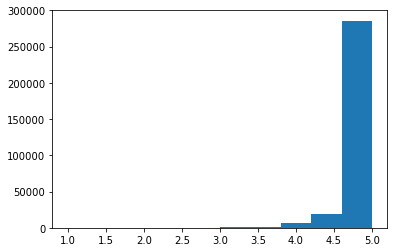

In [26]:
plt.hist(rating)
plt.show()
# 별점이 상위에 다 몰려 있다.

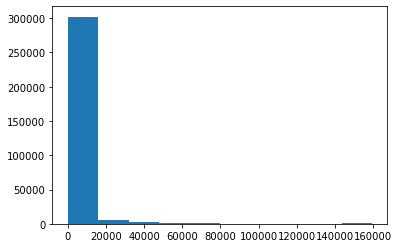

In [27]:
plt.hist(rating_num)
plt.show()
# 별점 개수는 대체로 50000개 이하

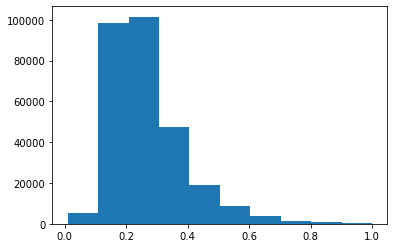

In [28]:
plt.hist(age18)
plt.show()

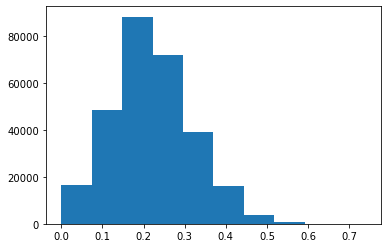

In [29]:
plt.hist(age19_23)
plt.show()

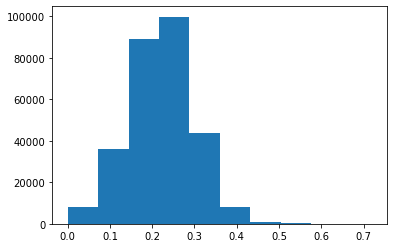

In [30]:
plt.hist(age24_28)
plt.show()
# 확실히 무신사는 10대 후반 ~ 20대 후반까지 많이 이용하는 플랫폼임을 알 수 있다. 

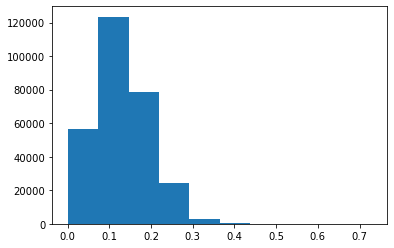

In [31]:
plt.hist(age29_33)
plt.show()

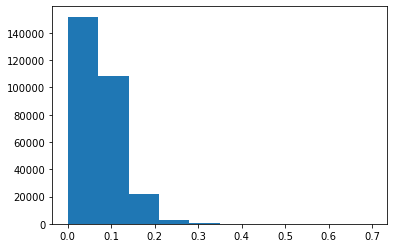

In [32]:
plt.hist(age34_39)
plt.show()

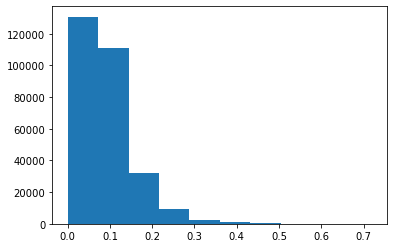

In [33]:
plt.hist(age40)
plt.show()

- 

In [34]:
# 별점 * 별점 개수/ 총 개수
# 5 * 2743 / 364704 = rating * (rating_num / max_count)
# P()

In [35]:
max_counting = 364704

In [36]:
def rating_scale(row):
    fraction = row['rating_num'] / max_counting
    
    scaled_rate = fraction * row['rating']
    return scaled_rate

In [37]:
data['fraction_scaled_rating'] = data.apply(rating_scale, axis=1)

In [38]:
data.describe()
# fraction_scaled_rating은 결측치를 보완하고 해야할 듯 싶다 

,rating,rating_num,age18,age19_23,age24_28,age29_33,age34_39,age40,rating_sum,scaled_rating_sum,fraction_scaled_rating
count,313864.000000,313864.000000,285904.000000,285904.000000,285904.000000,285904.000000,285904.000000,285904.000000,364704.000000,364704.000000,313864.000000
mean,4.768940,2743.177962,0.265649,0.219643,0.220408,0.130024,0.070485,0.093785,11326.909515,0.074008,0.036088
std,0.257745,12469.292293,0.123661,0.096104,0.074433,0.062594,0.046200,0.058472,55786.625546,0.364530,0.164337
min,1.000000,1.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000003
25%,4.700000,11.000000,0.180000,0.150000,0.170000,0.080000,0.040000,0.050000,19.200000,0.000119,0.000148
50%,4.800000,72.000000,0.240000,0.220000,0.220000,0.120000,0.060000,0.080000,190.000000,0.001235,0.000948
75%,4.900000,648.000000,0.320000,0.280000,0.270000,0.170000,0.090000,0.120000,2059.200000,0.013449,0.008529
max,5.000000,159414.000000,1.000000,0.740000,0.720000,0.730000,0.700000,0.720000,765187.200000,5.000000,2.098105


In [39]:
from sklearn.preprocessing import MinMaxScaler

In [40]:
rating_sum = np.asarray(data['fraction_scaled_rating'])
rating_sum = rating_sum.reshape(-1,1)

In [41]:
# standard scaler 선언 및 학습
MinMaxScaler = MinMaxScaler(feature_range=(0,5))
MinMaxScaler.fit(rating_sum) ## 각 칼럼 데이터마다 변환할 함수 생성
scaled_rating_sum = MinMaxScaler.transform(rating_sum)

In [42]:
scaled_rating_sum

array([[0.4858079],
       [0.4858079],
       [0.4858079],
       ...,
       [0.0040709],
       [0.0040709],
       [0.0040709]])

In [43]:
data['fraction_scaled_rating_minmax'] = scaled_rating_sum

In [44]:
data.describe()

,rating,rating_num,age18,age19_23,age24_28,age29_33,age34_39,age40,rating_sum,scaled_rating_sum,fraction_scaled_rating,fraction_scaled_rating_minmax
count,313864.000000,313864.000000,285904.000000,285904.000000,285904.000000,285904.000000,285904.000000,285904.000000,364704.000000,364704.000000,313864.000000,313864.000000
mean,4.768940,2743.177962,0.265649,0.219643,0.220408,0.130024,0.070485,0.093785,11326.909515,0.074008,0.036088,0.085995
std,0.257745,12469.292293,0.123661,0.096104,0.074433,0.062594,0.046200,0.058472,55786.625546,0.364530,0.164337,0.391632
min,1.000000,1.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000003,0.000000
25%,4.700000,11.000000,0.180000,0.150000,0.170000,0.080000,0.040000,0.050000,19.200000,0.000119,0.000148,0.000346
50%,4.800000,72.000000,0.240000,0.220000,0.220000,0.120000,0.060000,0.080000,190.000000,0.001235,0.000948,0.002252
75%,4.900000,648.000000,0.320000,0.280000,0.270000,0.170000,0.090000,0.120000,2059.200000,0.013449,0.008529,0.020318
max,5.000000,159414.000000,1.000000,0.740000,0.720000,0.730000,0.700000,0.720000,765187.200000,5.000000,2.098105,5.000000


무신사 홈페이지 세부카테고리별 10페이지

1. 컨텐츠 메타 데이터 :  아이템 이름(name) / 브랜드(brand) / 평균 평점(rating) / 리뷰 수(rating_num) / 좋아요 수(like) / 조회수(view) / 태그(tags) / 코디(coordi) / 가격(sale) / 나이대별 선호도 수치(age_num)

2. 사용자 행동 데이터 :  아이템 이름 / 유저 아이디 / 유저 정보(사이즈, 성별, 키, 몸무게) / 평점 / 리뷰

### 상품의 가중평균

- 어떤 상품에 대해서 10명이 평가하여 5점이 나온 상품과 100명이 평가하여 4점이 나온 상품이 있을 수 있기 때문입니다.
- 이 때, 10명이 평가하여 5점이 나온 상품이 무조건적으로 더 좋은 상품이라고 할 수 없다. 
- 아래 식보다 분명 더 좋은 식이 있을 것


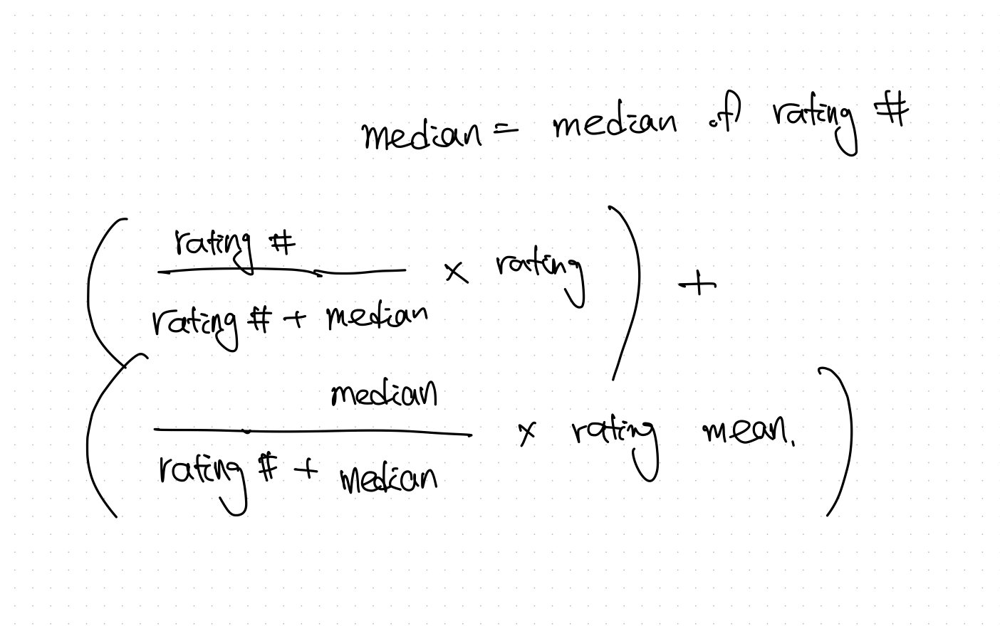

In [77]:
df = pd.read_csv('./musinsa_data.csv', converters={"data": literal_eval, "label" : literal_eval})       

In [84]:
copy_df = df[:20000]

In [85]:
copy_df.head()

,Unnamed: 0,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,...,coordi,age18,age19_23,age24_28,age29_33,age34_39,age40,man,woman,img
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,"['스트릿', '스포츠', '캐주얼']",32%,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...
1,1,THINK PACK,가방,백팩,YALE,YB1BG0031BK0,"['백팩', '노트북백팩', '백팩추천', '데일리백', '코듀라', '로고', '...","119,000원",4.9,3184.0,...,['캐주얼'],41%,27%,16%,5%,2%,9%,43%,57%,https://image.msscdn.net/images/goods_img/2021...
2,2,메쉬 스트링 백팩 블랙,가방,백팩,NEIKIDNIS,NBP005-101,"['메쉬스트링백팩', '스트링백팩', 'MESHSTRINGBACKPACK', '코듀...","69,000원",4.9,3733.0,...,['캐주얼'],42%,25%,16%,5%,2%,10%,44%,56%,https://image.msscdn.net/images/goods_img/2020...
3,3,앱솔루트 백팩 블랙,가방,백팩,NEIKIDNIS,037ASB06,"['백팩', '앱솔루트', '학생가방', '코듀라', '포켓', '노트북', '커플...","94,000원",4.8,12697.0,...,['캐주얼'],44%,18%,16%,8%,3%,11%,48%,52%,https://image.msscdn.net/images/goods_img/2017...
4,4,슈퍼브레이크 BLACK,가방,백팩,JANSPORT,JS0A4QUT008,"['슈퍼브레이크', '백팩', '가방', '데일리', '여행', '아웃도어', '포켓']","49,000원",4.8,3823.0,...,['캐주얼'],41%,28%,15%,6%,3%,7%,23%,77%,https://image.msscdn.net/images/goods_img/2020...


In [89]:
copy_df.describe()

,Unnamed: 0,rating,rating_num
count,20000.000000,15341.000000,15341.000000
mean,4003.261800,4.777870,1836.866045
std,2933.857445,0.269823,10853.410967
min,0.000000,1.000000,1.000000
25%,1666.000000,4.700000,7.000000
50%,3333.000000,4.800000,32.000000
75%,5863.250000,4.900000,279.000000
max,10863.000000,5.000000,159414.000000


In [90]:
max_counting = 159414

In [91]:
def rating_scale(row):
    fraction = row['rating_num'] / max_counting
    
    scaled_rate = fraction * row['rating']
    return scaled_rate

In [92]:
copy_df['fraction_scaled_rating'] = copy_df.apply(rating_scale, axis=1)

In [98]:
from sklearn.preprocessing import MinMaxScaler
rating_sum = np.asarray(copy_df['fraction_scaled_rating'])
rating_sum = rating_sum.reshape(-1,1)

# standard scaler 선언 및 학습
MinMaxScaler = MinMaxScaler(feature_range=(0,5))
MinMaxScaler.fit(rating_sum) ## 각 칼럼 데이터마다 변환할 함수 생성
scaled_rating_sum = MinMaxScaler.transform(rating_sum)

scaled_rating_sum

array([[0.4858079 ],
       [0.10193989],
       [0.11951797],
       ...,
       [0.05463115],
       [0.00977932],
       [0.00413952]])

In [99]:
copy_df['fraction_scaled_rating_minmax'] = scaled_rating_sum

In [100]:
copy_df

,Unnamed: 0,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,...,age19_23,age24_28,age29_33,age34_39,age40,man,woman,img,fraction_scaled_rating,fraction_scaled_rating_minmax
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,27%,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,0.466381,0.485808
1,1,THINK PACK,가방,백팩,YALE,YB1BG0031BK0,"['백팩', '노트북백팩', '백팩추천', '데일리백', '코듀라', '로고', '...","119,000원",4.9,3184.0,...,27%,16%,5%,2%,9%,43%,57%,https://image.msscdn.net/images/goods_img/2021...,0.097868,0.101940
2,2,메쉬 스트링 백팩 블랙,가방,백팩,NEIKIDNIS,NBP005-101,"['메쉬스트링백팩', '스트링백팩', 'MESHSTRINGBACKPACK', '코듀...","69,000원",4.9,3733.0,...,25%,16%,5%,2%,10%,44%,56%,https://image.msscdn.net/images/goods_img/2020...,0.114743,0.119518
3,3,앱솔루트 백팩 블랙,가방,백팩,NEIKIDNIS,037ASB06,"['백팩', '앱솔루트', '학생가방', '코듀라', '포켓', '노트북', '커플...","94,000원",4.8,12697.0,...,18%,16%,8%,3%,11%,48%,52%,https://image.msscdn.net/images/goods_img/2017...,0.382310,0.398234
4,4,슈퍼브레이크 BLACK,가방,백팩,JANSPORT,JS0A4QUT008,"['슈퍼브레이크', '백팩', '가방', '데일리', '여행', '아웃도어', '포켓']","49,000원",4.8,3823.0,...,28%,15%,6%,3%,7%,23%,77%,https://image.msscdn.net/images/goods_img/2020...,0.115112,0.119902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,4121,우먼즈 오버사이즈 스웨트셔츠 [네이비],상의,맨투맨/스웨트셔츠,MUSINSA STANDARD,MWJTK102-NA,"['무신사스탠다드우먼즈', '오버핏', '우먼즈스웨트컬렉션', '스웨트컬렉션', '...","20,900원",4.8,2289.0,...,21%,16%,12%,15%,23%,12%,88%,https://image.msscdn.net/images/goods_img/2020...,0.068922,0.071788
19996,4122,플랫 테리 오버사이즈 스트링 스웨트셔츠 [화이트],상의,맨투맨/스웨트셔츠,MUSINSA STANDARD,MMATK706-WH,"['맨투맨', '스트링', '라운지웨어', '이지웨어', '오버핏', '스웨트컬렉션']","28,900원",4.9,1618.0,...,31%,22%,13%,6%,7%,85%,15%,https://image.msscdn.net/images/goods_img/2021...,0.049733,0.051799
19997,4123,RAINBOW REFLECTIVE LOGO CREWNECK BLACK(MG2BSMM...,상의,맨투맨/스웨트셔츠,MAHAGRID,MG2BSMM475ABK,"['맨투맨', '스웻셔츠', '기모']","49,000원",4.8,1742.0,...,17%,10%,6%,2%,9%,49%,51%,https://image.msscdn.net/images/goods_img/2019...,0.052452,0.054631
19998,4124,슈무 아치로고 맨투맨 블랙,상의,맨투맨/스웨트셔츠,WHATITISNT,MG2101CR11BK,"['크루넥', '맨투맨', '상의', '맨투맨티셔츠', '루즈핏맨투맨', '로고',...","69,000원",4.8,312.0,...,22%,14%,5%,4%,16%,55%,45%,https://image.msscdn.net/images/goods_img/2021...,0.009394,0.009779


In [93]:
# M = np.round(copy_df['rating'].mean(),2) # rating mean
# m = copy_df['rating_num'].quantile(0.5) # median

In [94]:
# # 가중평균
# def weighted_vote_average(record):
#     r= copy_df['rating_num']
#     R= copy_df['rating']
    
#     return ( (r/(r+m)*R) ) + ( (m/(m+r)*M)  )

In [95]:
# tqdm.pandas()
# copy_df['weighted_vote'] = copy_df.progress_apply(weighted_vote_average, axis=1)

In [101]:
from sklearn.feature_extraction.text import TfidfVectorizer

- 태그 자체를 공백 기준으로 한 문장으로 만들어버리면 하나의 코퍼스
- 코퍼스끼리의 유사도를 이용하면 비슷한 상품이 추천되지 않나..?

In [50]:
display(type(data['tags'][0]))
display(data['tags'][0])

str

"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']"

In [51]:
sample = data['tags'][0]
literal_eval(sample) 

['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']

In [53]:
copy_data = data[:10000]

In [102]:
temp = copy_df.tags.apply(lambda x : " ".join(literal_eval(x)))
temp

0                                 가방 데이팩 백팩 빅샷 신학기백팩 캠핑
1                       백팩 노트북백팩 백팩추천 데일리백 코듀라 로고 아이비리그
2        메쉬스트링백팩 스트링백팩 MESHSTRINGBACKPACK 코듀라 포켓 노트북 백팩
3                          백팩 앱솔루트 학생가방 코듀라 포켓 노트북 커플가방
4                           슈퍼브레이크 백팩 가방 데일리 여행 아웃도어 포켓
                              ...                      
19995    무신사스탠다드우먼즈 오버핏 우먼즈스웨트컬렉션 스웨트컬렉션 맨투맨 이지웨어 라운지웨어
19996                     맨투맨 스트링 라운지웨어 이지웨어 오버핏 스웨트컬렉션
19997                                       맨투맨 스웻셔츠 기모
19998                    크루넥 맨투맨 상의 맨투맨티셔츠 루즈핏맨투맨 로고 슈무
19999                스웨트셔츠 맨투맨티셔츠 맨투맨 스웻셔츠 로고맨투맨 루즈핏맨투맨
Name: tags, Length: 20000, dtype: object

In [103]:
copy_df['tags_tfidf'] = temp

In [104]:
copy_df.head()

,Unnamed: 0,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,...,age24_28,age29_33,age34_39,age40,man,woman,img,fraction_scaled_rating,fraction_scaled_rating_minmax,tags_tfidf
0,0,NM2DN51A_빅샷,가방,백팩,THE NORTH FACE,NM2DN51A,"['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']","150,000원",4.9,15173.0,...,21%,10%,3%,7%,60%,40%,https://image.msscdn.net/images/goods_img/2019...,0.466381,0.485808,가방 데이팩 백팩 빅샷 신학기백팩 캠핑
1,1,THINK PACK,가방,백팩,YALE,YB1BG0031BK0,"['백팩', '노트북백팩', '백팩추천', '데일리백', '코듀라', '로고', '...","119,000원",4.9,3184.0,...,16%,5%,2%,9%,43%,57%,https://image.msscdn.net/images/goods_img/2021...,0.097868,0.101940,백팩 노트북백팩 백팩추천 데일리백 코듀라 로고 아이비리그
2,2,메쉬 스트링 백팩 블랙,가방,백팩,NEIKIDNIS,NBP005-101,"['메쉬스트링백팩', '스트링백팩', 'MESHSTRINGBACKPACK', '코듀...","69,000원",4.9,3733.0,...,16%,5%,2%,10%,44%,56%,https://image.msscdn.net/images/goods_img/2020...,0.114743,0.119518,메쉬스트링백팩 스트링백팩 MESHSTRINGBACKPACK 코듀라 포켓 노트북 백팩
3,3,앱솔루트 백팩 블랙,가방,백팩,NEIKIDNIS,037ASB06,"['백팩', '앱솔루트', '학생가방', '코듀라', '포켓', '노트북', '커플...","94,000원",4.8,12697.0,...,16%,8%,3%,11%,48%,52%,https://image.msscdn.net/images/goods_img/2017...,0.382310,0.398234,백팩 앱솔루트 학생가방 코듀라 포켓 노트북 커플가방
4,4,슈퍼브레이크 BLACK,가방,백팩,JANSPORT,JS0A4QUT008,"['슈퍼브레이크', '백팩', '가방', '데일리', '여행', '아웃도어', '포켓']","49,000원",4.8,3823.0,...,15%,6%,3%,7%,23%,77%,https://image.msscdn.net/images/goods_img/2020...,0.115112,0.119902,슈퍼브레이크 백팩 가방 데일리 여행 아웃도어 포켓


### Tfidf 연산 문제점
- 컴퓨팅이 너무 많이 들어가서 컴퓨터가 다운
- run을 돌릴 수 없음
- 기존 데이터를 10000행으로 잘라서 사용

In [105]:
tfidf=TfidfVectorizer(min_df=1,ngram_range=(1,3))
tag_tf=tfidf.fit_transform(copy_df['tags_tfidf'])

In [106]:
tag_tf

<20000x65287 sparse matrix of type '<class 'numpy.float64'>'
	with 211432 stored elements in Compressed Sparse Row format>

In [107]:
# 1. 코사인유사도
from sklearn.metrics.pairwise import cosine_similarity

tf_sim=cosine_similarity(tag_tf,tag_tf)

In [111]:
tf_sim

array([[1.        , 0.01607264, 0.01464975, ..., 0.        , 0.        ,
        0.        ],
       [0.01607264, 1.        , 0.04633408, ..., 0.        , 0.0154123 ,
        0.        ],
       [0.01464975, 0.04633408, 1.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.03659997,
        0.19115368],
       [0.        , 0.0154123 , 0.        , ..., 0.03659997, 1.        ,
        0.09080578],
       [0.        , 0.        , 0.        , ..., 0.19115368, 0.09080578,
        1.        ]])

In [109]:
#최종 알고리즘
def sim_clothes(clothe, sim, top_n):
    
    # 찾고자 하는 옷 선택
    clothes=copy_df[data.name==clothe]
    # 찾고자 하는 옷의 인덱스 값만 추출하여 새로운 변수에 저장
    clothes_index=clothes.index.values
    
    # 코사인유사도를 구한 행렬을 역순으로 정렬 -> 유사도가 높은 순의 인덱스로 정렬됨 
    sim_sorted_ind=sim.argsort()[:,::-1]
    
    # 내가 추출하려는 옷의 인덱스의 행번째추출, 이중리스트이므로 [0][0]
    # -> 아이템이름을 추출 -> 내가 원하는 옷의 이름과 같지 않다면
    if copy_df.iloc[sim_sorted_ind[clothes.index][0][0]].name != clothe:
        
        # 내가 추출하려는 옷의 인덱스 행번째의 array를 리스트로 변경, 변수명 l로 저장
        l=sim_sorted_ind[clothes.index][0].tolist()
        # 내가 추출하려는 옷의 인덱스 값 자체를 리스트로 변경한 후 값으로 추출
        v=clothes.index.values.tolist()[0]
        
        # 리스트 l 에서 내가 추출하려고 한 옷의 값을 제거
        # -> 내가 추출하고자 하는 옷의 인덱스 번호가 제거된 리스트 생성 -> 내가 원하는 옷을 제외한 옷을 보고 싶은 것이기 때문
        l.remove(clothes.index.values.tolist()[0])
        
        # 리스트l의 array형태로 맞춰주기
        sim_sorted_ind2=np.array(l)
        
    
        # 자기 자신을 제외하고 유사도가 높은 인덱스를 top_n개수 만큼 추출
        # 내가 추출하고자 하는 인덱스의 값이 제거된 상태이므로 0값부터 원하는 개수만큼 출력
        similar_indexes=sim_sorted_ind2[0:(top_n)]
        
        a= copy_df.iloc[similar_indexes].sort_values(by='fraction_scaled_rating_minmax',ascending=False).drop('tags_tfidf',axis=1)
    
    else :
        # sim_indexes는 이중리스트 상태이므로 이중리스트를 해제한 후 인덱스를 이용해 해당 내용 추출
        similar_indexes=sim_sorted_ind[clothes_index,1:(top_n+1)]
        a= copy_df.iloc[similar_indexes[0]].sort_values(by='fraction_scaled_rating_minmax',ascending=False).drop('tags_tfidf',axis=1)
    
    return a

In [110]:
sim_clothes('NM2DN51A_빅샷', tf_sim, 5)

,Unnamed: 0,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,...,age19_23,age24_28,age29_33,age34_39,age40,man,woman,img,fraction_scaled_rating,fraction_scaled_rating_minmax
16,16,NM2DN52A 핫샷,가방,백팩,THE NORTH FACE,NM2DN52A,"['가방', '데이팩', '백팩', '핫샷']","145,000원",4.9,3121.0,...,27%,20%,9%,3%,6%,43%,57%,https://image.msscdn.net/images/goods_img/2019...,0.095932,0.099923
449,449,데이팩 - 블랙,가방,백팩,GREGORY,09J29024,"['데이팩', '백팩', 'BAGINBAG']","189,000원",4.8,741.0,...,12%,24%,15%,17%,7%,65%,35%,https://image.msscdn.net/images/goods_img/2017...,0.022312,0.023235
11565,701,NE3CN00G 코튼 볼 캡,모자,캡/야구 모자,THE NORTH FACE,NE3CN00G,['캠핑'],"36,000원",4.9,248.0,...,25%,25%,13%,7%,10%,47%,53%,https://image.msscdn.net/images/goods_img/2022...,0.007623,0.007934
717,717,daypack 25L orange,가방,백팩,UNIFORM BRIDGE,UB-2278,"['백팩', '데이팩']","99,000원",4.6,72.0,...,31%,34%,11%,4%,4%,78%,22%,https://image.msscdn.net/images/goods_img/2021...,0.002078,0.002158
495,495,빔즈보이 콜라보 데이팩 - SAGE GREEN,가방,백팩,GREGORY,09JJ4326,"['백팩', '데이팩']","209,000원",4.7,18.0,...,10%,18%,15%,13%,14%,76%,24%,https://image.msscdn.net/images/goods_img/2021...,0.000531,0.000546


### Word2Vec

In [112]:
from gensim.models import Word2Vec

In [113]:
word=[]
for words in copy_df.tags:
    word.append(words)

In [114]:
word[:10]

["['가방', '데이팩', '백팩', '빅샷', '신학기백팩', '캠핑']",
 "['백팩', '노트북백팩', '백팩추천', '데일리백', '코듀라', '로고', '아이비리그']",
 "['메쉬스트링백팩', '스트링백팩', 'MESHSTRINGBACKPACK', '코듀라', '포켓', '노트북', '백팩']",
 "['백팩', '앱솔루트', '학생가방', '코듀라', '포켓', '노트북', '커플가방']",
 "['슈퍼브레이크', '백팩', '가방', '데일리', '여행', '아웃도어', '포켓']",
 "['신학기가방', '코듀라', '백팩추천', '가방', '백팩', '남여공용']",
 "['가방', '백팩', '노트북', '빅사이즈', '버빌리안가방', '여행', '신학기가방']",
 "['가방', '남자백팩', '백팩', 'BACKPACK']",
 "['빅스튜던트', '백팩', '가방', '데일리', '여행', '아웃도어', '포켓']",
 "['댄커백팩', '엄브로가방', '신학기가방', '가벼운가방', '2WAY가방', '슬링백', '노트북백팩']"]

In [115]:
word2vec = Word2Vec(sentences=word, window=5, sg=1, min_count=1, size=100, workers= 4)

In [116]:
# 단어 벡터 평균구하기
def vectors(embedding):
    
    word_embedding=[]
    dec2vec=None
    count=0
    
    for word in embedding:
        try : 
            # word에 해당하는 단어를 워드투백에서 찾아 리스트에 붙힘
            # 100차원으로 형성됨a
            word_embedding.append(word2vec.wv[word]) 
            count+=1
        except : continue
    #print('='*30,"word_embedding1","="*30)
    #print(word_embedding)
    
    word_embedding2=np.array(word_embedding)
    #print('='*30,"word_embedding2","="*30)
    #print(word_embedding2)
    
    v=word_embedding2.sum(axis=0)  
    print(v)
    
    if type(v)!=np.ndarray:
        return np.zeros(100)
    
    return(v/count)

In [117]:
wordvec=[vectors(x) for x in word]

[  2.3196645   -0.61459327  -7.040573    -0.6224862    1.1123013
  -8.281012    -0.17312999   1.7797186    7.306652    -7.2005987
  -2.4464896    1.6344246    1.5428699    0.5787258   -1.7183077
  -0.75115347   0.20426646  -6.552205     4.460573    -0.60902345
  -7.715107     2.4562218    1.9300317    3.8055248    0.49703962
  -9.01986     -8.129423   -10.505495     2.8425794   -8.487198
  -0.19727615   5.015002     2.3356555   -0.33149934  -8.779145
   9.5630665   -6.48148     -8.124149    -0.5799125    9.5639715
 -11.750175     6.6304626   -8.2843895    6.0833526   -7.5378475
   2.6157317   -2.578164    -4.6480684    0.8115312   -1.2833142
   2.4193664    4.3024673    1.8646301   -1.0793847   -6.820415
  -2.0650318    3.173319    14.052965     0.96709895  -4.2415338
   7.316561    -3.6522505  -11.236991    -0.2569316    3.2979214
  10.856174    -5.076319    -0.37379646  -2.5440168   -4.5660677
  -2.533994   -10.981704    -0.4136424   -0.55847746  -3.5630739
   3.7294648    1.7301724 

  5.5174584  -1.4218917  -1.1451133   1.3790528 ]
[  2.1235957    1.1921641  -11.589915    -3.8861732    4.306818
 -16.291819    -1.0830116    4.59511      7.142581   -10.692312
  -4.1269326    0.75226057   3.0104125   -2.1286767   -2.962985
  -1.5590672    3.5225165  -10.142838     5.7130156    0.43868512
  -9.445003     2.667227     0.33223408   4.7648296    0.15979955
  -9.996559    -9.379031   -11.986635     2.8919544  -11.6152115
  -1.6100569    4.326523     4.7547054    0.51111156  -8.810333
  13.342883    -6.9796157   -8.035189    -0.06757769  14.72614
 -17.424042     7.7264037  -10.000777     8.526835    -5.9353676
   4.245709    -1.9464678   -7.120164     0.83880305  -0.2817728
   4.09908      7.5146475    5.591831    -0.03702772  -6.3299427
  -2.9612215    5.3562174   18.837812    -0.8478369   -5.6185164
  11.364757    -7.266107   -12.224961     1.1379197    6.0776176
  12.224991    -4.8828583    2.8135836   -2.4932644   -4.772588
  -4.228432   -13.913909     0.63966006  -3.4

  -1.6947525    9.789054    -4.826679    -3.7301276    3.417394  ]
[ 1.2760487  -0.55248195 -2.7897851   0.17849497  0.6580007  -5.02649
  0.01415318  1.2754719   3.8866622  -4.190257   -0.7103969   1.304382
  1.4709698  -1.3561747  -1.1888933  -0.86404705 -1.2539105  -2.2216616
  2.2001421  -1.01975    -4.3488507   1.4028337   0.24569106  3.0238445
  0.9848919  -3.0808556  -5.227637   -3.7710328   0.4570944  -5.824719
  0.39596248  1.9056861   1.6381749  -0.46867537 -4.363539    5.532483
 -3.0607862  -5.2604814  -0.8861246   5.190668   -6.4107795   2.6609118
 -3.323256    4.477584   -4.121894    1.5346148  -0.7821515  -2.55226
 -0.5242218  -0.57330704  1.0268005   2.6208837   2.128101    1.1322198
 -2.21552    -1.1506641   0.7816482   7.046826   -0.18175554 -2.0302615
  4.615302   -1.8170666  -4.3895965  -0.31597894  2.145606    4.3527336
 -2.4935324  -0.12227122 -1.5480894  -1.819024   -1.22899    -4.938689
 -0.5014277  -1.0657895  -2.9178226   2.1064563   2.1368506  -2.5978575
  3.7

  -1.0535655    6.5673566   -4.51559      1.2322695    0.84679556]
[  1.4246469    0.6689757   -4.6565967   -1.2791331    2.9266937
  -6.4376388   -1.207823     2.5638525    4.832244    -5.161226
   0.55912745   1.7857633    1.9591348   -2.4000869   -0.91905904
   0.18589649  -1.4311502   -5.3787713    2.2801352    0.7707346
  -4.951866     3.4297307   -0.34999782   2.5890896   -2.248637
  -5.583429    -7.031469    -4.37313      1.1773489   -7.802921
  -0.24970031   3.219193     2.2125354   -1.6441884   -7.4948187
   9.267871    -3.926037    -4.091137     0.86186546   9.074934
  -8.299316     4.608389    -6.821754     5.247695    -5.0984945
   0.9755064   -1.239913    -6.6787148    2.2023394   -1.4904703
   0.3874575    4.453602     2.2195358    1.259167    -2.6932185
  -1.3804327    1.829179    14.602746    -0.38814336  -6.6204753
   6.717289    -5.680358    -7.736715     1.1051024    2.4659998
   7.5936494   -4.456548     0.75401646  -3.445627    -3.848085
  -1.8746676   -6.4685955  

  -7.665433     9.132072    -1.5352545   -3.9137466    3.0633316 ]
[ 3.08667     0.15546945 -1.7142925  -2.4181676   0.5944823  -4.0865207
  1.3732309   1.9973158   4.9060965  -3.052119   -1.7958181   0.06309332
  1.5633806  -1.8956404  -1.7180027  -4.0909452  -0.5132239  -3.9888783
 -0.22855379 -1.8671092  -2.500565    2.586734    2.7189312   3.8573568
 -2.0742846  -5.9473443  -5.8293796  -4.8749876  -1.8096793  -6.3139095
 -0.8530328   3.6184545  -0.1097762  -1.2157475  -4.6974      5.3922296
 -3.575179   -3.5754223   1.4834363   7.2603593  -4.112229    2.9573581
 -5.4649034   3.157563   -3.2160125   2.0239546  -1.355637   -4.1724186
  0.04379311 -3.548095    1.0452623   4.575488    0.59665     0.10613326
 -3.46933    -1.9313619   1.3494544   8.019968   -1.1215097  -4.4996057
  1.3218669  -3.200843   -6.3577113   0.12063313  0.32997578  3.7756662
 -2.3013613  -3.1304822  -2.7346497  -3.1838894  -1.0925052  -5.4329214
 -1.4583374  -0.6625418  -5.619051    1.9223547   2.6130304  -2.180

  4.10923034e-01 -3.02773178e-01 -6.56764746e-01  1.12210631e-01]
[-1.51705861e-01  3.87457609e-02 -5.06446958e-01  7.34148026e-02
 -2.61052698e-02 -6.99210823e-01 -1.40137188e-02  4.09813076e-01
  1.31337851e-01 -2.76527852e-01 -5.26749611e-01  1.70096442e-01
  4.11302865e-01 -2.66293079e-01 -1.89950019e-01  3.58868182e-01
  3.82676721e-02 -4.11655545e-01  1.99264437e-01 -3.67340624e-01
 -3.34631145e-01  3.59323978e-01  1.32781476e-01  5.97228110e-01
 -1.03923008e-01 -5.64477071e-02 -5.44674635e-01 -4.50441629e-01
 -5.20474017e-01 -5.20859063e-01 -2.83651322e-01 -1.44791931e-01
  6.55946285e-02 -2.13710263e-01 -1.23836964e-01  2.68205762e-01
 -1.61738455e-01 -5.03625095e-01 -2.26534367e-01  2.07253203e-01
 -1.73565149e-02  2.49045759e-01 -2.72425234e-01  6.40495658e-01
 -3.55576485e-01  1.20922282e-01  2.19373386e-02 -3.93955499e-01
 -2.20631287e-01  1.87382758e-01 -6.43467009e-02  7.22895563e-01
  2.72355646e-01  5.10287344e-01 -6.37228847e-01 -3.03017348e-01
  2.71126717e-01  5.5524

[  6.4543133    2.2547328  -11.056473    -2.980672     0.15606704
 -13.354282     3.067845     1.3019977    6.8885584   -2.0249648
  -4.0791163   -0.75652426   4.6038694   -7.548079    -6.243007
  -9.9213505    0.64245766 -10.11818      0.42978936  -2.6187723
 -10.905003     6.1712446    2.2999187    7.8211226   -9.830561
 -15.469687   -18.58817    -17.785202    -3.4657037  -14.57823
  -5.080943     7.2273955   -2.0566008   -5.0724564  -11.215562
  20.094662   -10.757934    -6.068037    10.082695    27.28839
 -17.315321     3.373613   -13.022376    11.08869      0.6271843
   6.0560846   -0.89928293 -14.005313    -6.533293    -4.933851
   2.752833    11.277206     2.0988355    2.1194015   -7.6697893
  -6.3770123    5.3832426   24.892017    -3.444655   -11.810727
  10.365016   -12.285865   -14.840049     1.1950532   -1.2249926
  14.724177     2.0674958   -5.4637656   -3.9280653  -10.875694
  -4.8618183  -17.805403    -1.9753032   -4.407118    -8.314727
   7.233162     7.694491    -4.5629

  -4.3185396    6.0420437    1.707849    -0.69757855   3.68211   ]
[  6.7791233    0.9649282   -7.1562543   -3.611978    -1.7411876
  -8.563765     2.644533     0.9606248    6.75747     -2.615526
  -3.8540523   -0.9588047    1.3554127   -6.3331003   -5.511554
  -8.020181    -0.8321061   -8.15418     -0.20156541  -3.8102152
  -8.812895     4.928901     4.1439276    8.8004055   -7.2447295
 -15.243436   -15.997153   -14.449779    -1.3489249  -12.240127
  -2.9416008    6.918561    -2.5011759   -6.800009   -10.620547
  15.351759    -9.361714    -7.096206     6.953027    21.648462
 -13.085636     4.538458   -10.979018     9.537702     0.4214808
   5.2469363   -2.561398   -10.961801    -4.1381826   -6.058919
   0.14179632  10.271157     0.42914712  -0.15498438  -7.3086233
  -4.7875724    4.9837656   19.01847     -2.4696481   -9.014048
   8.330676    -7.4234724  -11.223037    -1.1491282   -1.1723474
  11.040509     1.9884526   -7.8266516   -3.738121    -9.032235
  -4.940852   -14.158509    -0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[-1.51705861e-01  3.87457609e-02 -5.06446958e-01  7.34148026e-02
 -2.61052698e-02 -6.99210823e-01 -1.40137188e-02  4.09813076e-01
  1.31337851e-01 -2.76527852e-01 -5.26749611e-01  1.70096442e-01
  4.11302865e-01 -2.66293079e-01 -1.89950019e-01  3.58868182e-01
  3.82676721e-02 -4.11655545e-01  1.99264437e-01 -3.67340624e-01
 -3.34631145e-01  3.59323978e-01  1.32781476e-01  5.97228110e-01
 -1.03923008e-01 -5.64477071e-02 -5.44674635e-01 -4.50441629e-01
 -5.20474017e-01 -5.20859063e-01 -2.83651322e-01 -1.44791931e-01
  6.55946285e-02 -2.13710263e-01 -1.23836964e-01  2.68205762e-01
 -1.61738455e-01 -5.03625095e-01 -2.26534367e-01  2.07253203e-01
 -1.73565149e-02  2.49045759e-01 -2.72425234e-01  6.40495658e-01
 -3.55576485e-01  1.20922282e-01  2.19373386e-02 -3.93955499e-01
 -2.20631287e-01  1.87382758e-01 -6.43467009e-02  7.22895563e-01
  2.72355646e-01  5.10287344e-01 -6.37228847e-01 -3.03017348e-01
  2.71126717e-01  5.55248439e-01 -1.75818175e-01  1.42815083e-01
  8.95634890e-02 -2.0201

   0.6248197   10.871302    -4.720457    -3.1914747    2.8873572 ]
[  4.8621364   -3.4254746  -12.890003    -2.3055758    7.039974
 -10.089527    -0.36886898   5.788776     5.840474   -12.340011
   0.22338653   1.402506     3.1895325   -0.6242403   -2.1146293
  -5.5837474    1.7596228   -7.1118984    6.254322    -2.0004501
  -9.25394      6.9092164    0.8148039    6.1017275    7.011603
  -9.063778    -8.279723   -15.938698     3.351769   -14.433383
   0.230073     5.42435      5.6001334   -0.1297126   -8.724539
  11.157801    -2.4279313  -14.340415     4.596131    20.513052
 -13.56783      6.836803    -9.938453    12.457466    -6.6652966
   3.7948494   -4.2120366   -9.037156    -1.2279898   -3.1455393
   2.3686037    9.060275     2.6966965    3.8350375   -6.406091
  -4.892662    -2.4726257   21.54841     -4.95433     -9.31474
   5.460736    -9.7469845  -12.74656      4.3221617    9.431519
  11.307134    -6.8757157    0.6259738   -3.932496   -10.943564
  -4.094323    -8.957277    -5.784

[  5.1410174   -0.40125424 -11.250653    -1.1958694    4.0174103
 -15.065628     0.10417176   4.391083     9.994123   -10.171445
  -1.3504562    1.5805818    3.1563976   -2.1961672   -2.6909425
  -3.7938662   -1.8595128   -7.12128      6.2205954   -2.3482788
 -10.342396     3.716744     2.0728135    6.8869586   -0.5347961
 -11.770314   -11.90673    -11.898124    -0.18196309 -12.874208
  -1.6552694    6.9607353    3.821127    -4.281763   -10.118841
  10.963226    -6.332667   -11.588227     0.08263969  16.468515
 -15.465085     8.823844   -12.195549     9.667906    -5.9672666
   1.4696872   -3.8712718   -9.671805    -0.30878654  -1.493536
   2.1754375    7.1785975    4.2558684   -2.0937066   -5.757178
  -4.5157747    2.5283222   21.36273     -0.94707686  -5.422539
   9.626376    -4.472713   -10.77368      4.1547523    5.836696
  13.031244    -6.4625044   -0.40684944  -4.1177006   -8.491878
  -2.6689258  -14.830465    -3.4547005   -2.8321264   -7.2657666
   3.2608025    3.8067474   -6.387

[  3.4559083    0.6066355  -10.042133    -2.7184434    3.489344
 -13.58119     -0.26775795   4.185847     6.9754543   -9.615032
  -0.5025452    2.0058513    4.3171325   -2.8072488   -2.303161
  -0.6323662    0.24709004  -4.375619     6.0951767   -0.9616706
  -8.15951      1.870031    -0.23777281   4.3241143    2.0617473
  -9.579834    -9.362767   -10.335805     1.4053473  -10.963116
  -1.6679413    4.9930387    3.5321383   -1.1949279   -8.673845
  10.826026    -5.5241756   -9.87127     -0.9338226   13.962361
 -14.039153     7.8173456  -10.947535     8.14769     -5.8463054
   3.1411583   -1.5562398   -8.000394     0.2782099   -0.9715723
   3.1470723    8.386459     4.770102     0.5138986   -2.565073
  -3.6398532    1.9745274   18.028475    -2.798889    -6.013175
   9.636382    -5.748689    -9.412093     3.362426     5.340659
  10.101325    -4.7669063    0.46898     -0.8915317   -4.8114424
  -3.3020422  -12.752189    -0.6621053   -4.0915775   -4.76354
   1.1022997    1.2046317   -3.12194

  5.345658   -3.2504568  -2.2859836   0.5202048 ]
[ 5.3674726e+00  1.2121508e+00 -8.8292036e+00 -2.7993155e+00
  3.5787153e+00 -1.3385200e+01 -2.2353866e+00  3.1473737e+00
  6.9751120e+00 -6.6335583e+00 -1.9878950e+00 -3.8717830e-01
  2.2683775e+00  9.2215139e-01 -2.1469276e+00 -1.4887993e+00
  1.4916968e+00 -5.4437227e+00  5.5486012e+00 -1.1095665e+00
 -7.6861477e+00  1.0898496e+00  1.2716628e+00  5.6585169e+00
  1.3955789e+00 -7.6813941e+00 -5.9196525e+00 -8.0845375e+00
  6.7651117e-01 -6.2541466e+00 -1.0663896e+00  5.6315317e+00
  3.2289648e+00 -3.6042950e+00 -5.8547029e+00  7.6743393e+00
 -5.0834765e+00 -7.4019709e+00 -1.3024177e-02  1.0050705e+01
 -1.1097977e+01  6.4100275e+00 -9.1292381e+00  5.9162450e+00
 -3.4487436e+00  1.3231965e+00 -2.3393259e+00 -6.6414509e+00
 -3.6688951e-01  3.7998611e-01  5.5809374e+00  6.4983082e+00
  2.7040303e+00 -1.1932912e+00 -5.5015302e+00 -2.0725267e+00
  1.6365091e+00  1.6273952e+01  4.1439408e-01 -2.7764215e+00
  6.3829684e+00 -4.7136803e+00 -8.5

[  3.5326576    1.4171754  -12.8851595   -5.5066853    7.0152416
 -22.236208     0.18543313   2.1793365    6.3449     -10.445119
  -8.137627     3.7203248    8.888837     4.9615073   -5.8368516
  -1.6554289    2.8381784  -12.216915     4.628643    -4.171597
 -11.642252     5.004752    -0.76885056   4.4840384    1.444153
  -8.908256    -9.207829   -19.30256      0.8878714  -16.69329
  -7.4213343    6.443387     5.078323     4.822966   -14.518249
  13.557371   -10.473752    -9.753262    -3.174552    17.550243
 -12.187476     9.704219   -11.401809     9.227358    -6.152406
   1.8224376   -2.358383   -14.043407    -0.83395183  -2.6449254
   5.883929     6.781398     3.6564844   -5.4013114   -1.4119086
  -1.6891487    7.2300844   21.552116     5.8035197   -6.137109
  10.359969    -7.036021   -16.594921    -1.8756597    4.833969
  18.331938    -2.705907     4.0802803   -0.03580876  -4.497304
  -5.0011997  -17.36061      1.5483358   -5.5134544   -0.5016841
  -1.3482223   -4.971487    -6.67039

[ 9.3932953e+00  2.2657502e+00 -2.3160894e+00 -1.1069629e+01
  2.1940701e+00 -1.8240463e+01  4.4454660e+00  1.2096786e+01
  1.6664423e+01 -1.4125111e+01 -1.4739168e+01 -1.2187089e+00
  3.0281880e-01 -4.2092381e+00  2.2452497e+00 -1.5354655e+01
 -5.2185827e-01 -3.9980431e+00  6.4772902e+00 -7.5353107e+00
  3.7112942e+00  8.7485447e+00  1.5404119e+01  8.5448074e+00
  1.2766382e+00 -1.0438646e+01 -9.4848862e+00 -1.1972962e+01
 -5.9126201e+00 -1.9504673e+01 -4.1743162e-01  8.0637541e+00
 -1.8218968e-02  1.1080893e+01 -1.5271633e+01  2.0411827e+01
 -7.1931906e+00 -9.6858273e+00 -3.3803530e+00  6.9585819e+00
 -8.2120409e+00  6.8376546e+00 -1.2985548e+01  2.4525671e+00
 -1.7087219e+01  6.6459846e+00 -5.1864643e+00 -1.1628040e+01
  6.0014219e+00 -9.1719465e+00  4.2065096e+00  1.4375763e+01
 -2.2374189e+00 -3.0773487e+00 -1.3191631e+01 -3.0256464e+00
  7.1193533e+00  1.4960986e+01 -1.0975356e+00 -9.0842056e+00
 -2.6868525e-01 -1.2414166e+01 -2.7344034e+01 -4.7977853e+00
 -1.3218898e+00  2.36818

[  3.2354913    1.5250226  -11.219128    -5.2946744    3.5953968
 -13.792804    -1.8107977    5.2634773    6.900531    -8.664249
  -0.34924772   1.1594791    2.4851336   -2.4304667   -2.8793588
  -1.678041     2.229921    -4.0258164    5.6071205   -0.95148367
  -7.373856     1.2619267    2.1022928    4.2773757    2.313675
  -9.251509    -8.110018    -8.857248     2.4871807   -9.429548
  -1.4570909    4.817298     3.357657    -0.9764106   -7.125895
  10.171466    -4.2060184   -9.641293    -0.22475822  11.784285
 -14.452118     6.8529353  -10.004659     6.1191173   -5.8748865
   3.7033358   -3.0647025   -5.8351393    0.26661584  -1.6160628
   4.914967     9.633269     3.7970388    0.5955082   -4.5428057
  -3.6069205   -0.28071797  17.564503    -1.9383261   -5.5283012
   7.0590477   -6.514196   -10.641823     2.693212     5.3923187
  11.669416    -4.9290166   -0.72725695  -1.7573676   -3.9887598
  -2.0974767  -13.712841    -1.2265235   -2.0900369   -4.6804066
   1.1826146    2.1373594   -

  4.10923034e-01 -3.02773178e-01 -6.56764746e-01  1.12210631e-01]
[ 1.7724339e+00  1.4735562e+00 -9.2822685e+00 -4.1632948e+00
  3.3322568e+00 -1.0952821e+01 -1.6234863e+00  3.2361925e+00
  4.0078421e+00 -6.6686587e+00 -1.5840366e+00  2.0560865e-01
  1.6753232e+00 -3.2110922e+00 -1.2300379e+00 -3.1079680e-01
  6.1589235e-01 -5.3933406e+00  5.0350914e+00  7.9825842e-01
 -5.2585320e+00  1.9804062e+00 -1.0072373e-01  3.0807226e+00
  1.3393551e+00 -5.8795900e+00 -6.6472974e+00 -7.6109033e+00
  1.4293959e+00 -8.9243078e+00 -9.8661858e-01  3.8062179e+00
  2.4887879e+00 -7.3896217e-01 -4.2399201e+00  8.6330328e+00
 -3.3427563e+00 -7.1954045e+00  9.4197166e-01  1.0533023e+01
 -1.2142816e+01  4.3041477e+00 -6.7691288e+00  5.6933293e+00
 -5.8468533e+00  2.5435889e+00 -2.4993637e+00 -6.9580398e+00
  1.0987550e-02 -7.1725738e-01  3.4090152e+00  7.9941330e+00
  2.3158934e+00 -3.5244894e-01 -3.3788042e+00 -2.9186299e+00
  2.0178061e+00  1.5981433e+01 -1.2895389e+00 -4.3782845e+00
  7.5636268e+00 -5.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[-1.51705861e-01  3.87457609e-02 -5.06446958e-01  7.34148026e-02
 -2.61052698e-02 -6.99210823e-01 -1.40137188e-02  4.09813076e-01
  1.31337851e-01 -2.76527852e-01 -5.26749611e-01  1.70096442e-01
  4.11302865e-01 -2.66293079e-01 -1.89950019e-01  3.58868182e-01
  3.82676721e-02 -4.11655545e-01  1.99264437e-01 -3.67340624e-01
 -3.34631145e-01  3.59323978e-01  1.32781476e-01  5.97228110e-01
 -1.03923008e-01 -5.64477071e-02 -5.44674635e-01 -4.50441629e-01
 -5.20474017e-01 -5.20859063e-01 -2.83651322e-01 -1.44791931e-01
  6.55946285e-02 -2.13710263e-01 -1.23836964e-01  2.68205762e-01
 -1.61738455e-01 -5.03625095e-01 -2.26534367e-01  2.07253203e-01
 -1.73565149e-02  2.49045759e-01 -2.72425234e-01  6.40495658e-01
 -3.55576485e-01  1.20922282e-01  2.19373386e-02 -3.93955499e-01
 -2.20631287e-01  1.87382758e-01 -6.43467009e-02  7.22895563e-01
  2.72355646e-01  5.10287344e-01 -6.37228847e-01 -3.03017348e-01
  2.71126717e-01  5.55248439e-01 -1.75818175e-01  1.42815083e-01
  8.95634890e-02 -2.0201

  -0.6874673   13.049447   -10.4594145   -8.050307    -0.5239688 ]
[  7.485939     4.020555    -3.3872292  -12.099132     2.5515454
 -18.098824     5.597244     9.729386    15.567322   -14.745637
 -10.296673     1.5279644    0.22237779  -3.5460043    0.48740184
 -11.795963    -1.2455971   -5.743978     3.937588    -2.058318
   1.894149    12.480042    13.791301     8.595808     1.4981678
 -12.739527   -12.194498   -12.52997     -3.2311964  -15.93621
  -0.94792295   5.9860992   -1.1615667    7.8735137  -15.815741
  18.436544    -5.0579476   -9.327989    -3.7505746    6.6294413
  -7.2578344    5.609839   -11.753718     3.9960263  -16.95421
   5.8867908   -8.211139   -12.284185     5.012226    -7.7243805
   0.30125526  12.871043     0.09568449   0.11326175 -11.54764
  -6.925964     6.311899    16.536314    -2.0872047  -10.5507145
   2.7111166  -11.202044   -25.89571     -5.793849    -1.6163287
   2.807577    -7.018946     0.16510431  -8.569671    -7.758897
  -3.275013   -15.084015    -5.5

  3.043732   -3.393638   -3.009747    1.7173468 ]
[-0.5063015   0.5336341  -1.8023889  -0.8603688   0.6177115  -2.1575682
 -0.02265845  1.5109189   0.7937458  -1.5589474  -0.7498998   0.21696202
  0.25819325  0.03912851 -0.44985983 -0.13230106 -0.6303395  -1.4805926
  0.23206663  0.01967588 -0.9648143   1.0961924   0.07961353  0.3738415
  0.25616604 -1.1433066  -2.0560775  -1.5270798   0.18999013 -1.8485314
  0.00681651  0.08143536  0.70484143 -0.20210434 -1.2336335   2.0483906
 -1.1196584  -1.8447913  -0.09345241  0.91883194 -0.45823938  0.6141074
 -1.7183517   1.2095833  -1.6105239   0.5376112  -0.70891094 -0.6033999
 -0.5695454  -1.0430883  -0.12035224  0.77087986  0.6551854   0.80360335
 -0.34088224 -1.1942853   0.30684733  1.9614141  -0.5765245  -0.8541361
  0.8561884   0.05849723 -1.0834669  -0.8937711   0.41634154  0.5943875
 -1.1345085  -0.2664279  -0.4549791   0.28888288 -0.01744542 -0.96640825
 -1.4583408  -0.1260252  -1.4842329   0.22303192  0.33434772 -0.49833995
  1.661272

  -1.1748232    9.345658    -1.7420633   -2.680261     5.6114445 ]
[  2.086535     6.709837   -10.823085    -3.6836476    3.6736457
 -13.109941    -0.02463514   5.785332     6.186017    -6.5824637
  -2.7015214    1.3003423    3.5156145   -0.11612847  -3.094134
  -3.8803287   -4.000705    -7.347629     4.3322926   -0.27137366
  -8.115802     3.973029    -0.04271813   2.0594437   -2.4475553
  -9.449902    -9.458206   -13.076801    -2.145187   -10.039731
  -4.566635     1.189096     1.2456034   -2.847771    -6.352305
   5.6395483   -5.727263    -8.416923     1.1396505   12.565195
 -10.591091     7.3014574  -13.578466     7.4973683   -4.1958685
   1.48555     -2.4607854   -7.366676     0.9442067   -1.8449112
   1.9877019    3.5337548    4.5356836   -1.2818447   -4.5237355
  -3.8157089    0.2751691   14.702094    -1.2900577   -4.57747
   5.8015976   -1.9349916   -9.866662     5.4970813    2.7401576
  10.37859     -5.899786    -2.0222418   -0.5268884   -7.426787
  -4.0145      -9.514386    -

  4.10923034e-01 -3.02773178e-01 -6.56764746e-01  1.12210631e-01]
[-1.51705861e-01  3.87457609e-02 -5.06446958e-01  7.34148026e-02
 -2.61052698e-02 -6.99210823e-01 -1.40137188e-02  4.09813076e-01
  1.31337851e-01 -2.76527852e-01 -5.26749611e-01  1.70096442e-01
  4.11302865e-01 -2.66293079e-01 -1.89950019e-01  3.58868182e-01
  3.82676721e-02 -4.11655545e-01  1.99264437e-01 -3.67340624e-01
 -3.34631145e-01  3.59323978e-01  1.32781476e-01  5.97228110e-01
 -1.03923008e-01 -5.64477071e-02 -5.44674635e-01 -4.50441629e-01
 -5.20474017e-01 -5.20859063e-01 -2.83651322e-01 -1.44791931e-01
  6.55946285e-02 -2.13710263e-01 -1.23836964e-01  2.68205762e-01
 -1.61738455e-01 -5.03625095e-01 -2.26534367e-01  2.07253203e-01
 -1.73565149e-02  2.49045759e-01 -2.72425234e-01  6.40495658e-01
 -3.55576485e-01  1.20922282e-01  2.19373386e-02 -3.93955499e-01
 -2.20631287e-01  1.87382758e-01 -6.43467009e-02  7.22895563e-01
  2.72355646e-01  5.10287344e-01 -6.37228847e-01 -3.03017348e-01
  2.71126717e-01  5.5524

  -0.3607057   10.027798    -6.71708     -3.7593663    4.183619  ]
[-1.51705861e-01  3.87457609e-02 -5.06446958e-01  7.34148026e-02
 -2.61052698e-02 -6.99210823e-01 -1.40137188e-02  4.09813076e-01
  1.31337851e-01 -2.76527852e-01 -5.26749611e-01  1.70096442e-01
  4.11302865e-01 -2.66293079e-01 -1.89950019e-01  3.58868182e-01
  3.82676721e-02 -4.11655545e-01  1.99264437e-01 -3.67340624e-01
 -3.34631145e-01  3.59323978e-01  1.32781476e-01  5.97228110e-01
 -1.03923008e-01 -5.64477071e-02 -5.44674635e-01 -4.50441629e-01
 -5.20474017e-01 -5.20859063e-01 -2.83651322e-01 -1.44791931e-01
  6.55946285e-02 -2.13710263e-01 -1.23836964e-01  2.68205762e-01
 -1.61738455e-01 -5.03625095e-01 -2.26534367e-01  2.07253203e-01
 -1.73565149e-02  2.49045759e-01 -2.72425234e-01  6.40495658e-01
 -3.55576485e-01  1.20922282e-01  2.19373386e-02 -3.93955499e-01
 -2.20631287e-01  1.87382758e-01 -6.43467009e-02  7.22895563e-01
  2.72355646e-01  5.10287344e-01 -6.37228847e-01 -3.03017348e-01
  2.71126717e-01  5.552

  3.6649816  -1.1238203  -0.79244554  1.2521703 ]
[-1.51705861e-01  3.87457609e-02 -5.06446958e-01  7.34148026e-02
 -2.61052698e-02 -6.99210823e-01 -1.40137188e-02  4.09813076e-01
  1.31337851e-01 -2.76527852e-01 -5.26749611e-01  1.70096442e-01
  4.11302865e-01 -2.66293079e-01 -1.89950019e-01  3.58868182e-01
  3.82676721e-02 -4.11655545e-01  1.99264437e-01 -3.67340624e-01
 -3.34631145e-01  3.59323978e-01  1.32781476e-01  5.97228110e-01
 -1.03923008e-01 -5.64477071e-02 -5.44674635e-01 -4.50441629e-01
 -5.20474017e-01 -5.20859063e-01 -2.83651322e-01 -1.44791931e-01
  6.55946285e-02 -2.13710263e-01 -1.23836964e-01  2.68205762e-01
 -1.61738455e-01 -5.03625095e-01 -2.26534367e-01  2.07253203e-01
 -1.73565149e-02  2.49045759e-01 -2.72425234e-01  6.40495658e-01
 -3.55576485e-01  1.20922282e-01  2.19373386e-02 -3.93955499e-01
 -2.20631287e-01  1.87382758e-01 -6.43467009e-02  7.22895563e-01
  2.72355646e-01  5.10287344e-01 -6.37228847e-01 -3.03017348e-01
  2.71126717e-01  5.55248439e-01 -1.7581

   1.486283    21.229338   -13.041652     1.2860801    9.106008  ]
[ -2.2866015  -13.053747   -13.564059     5.2994       7.235405
 -27.073296     0.22984602   8.523761    11.337577   -17.838345
  -3.0335336    4.4009485    0.84302264  -7.0558386   -9.492691
  -1.937587     6.304287    -9.282704    10.739496    -6.5168953
  -9.141316    16.746626     0.41240537  10.284999     4.447253
 -17.984661   -13.803893   -26.563585    -0.5147461  -16.67347
   0.31769037  -1.4454718    2.637113     2.7754424  -17.168287
  17.208515    -8.731099   -20.517355     9.556731    30.038054
  -7.700687     7.557853    -6.2830553   14.368722     0.39187697
   2.6322584    0.16278467 -13.747962     2.7593243   -8.343375
  -3.3003364    4.7387605    2.8981035    7.8801804    5.883287
  -7.1086674    3.452484    17.616117    -4.3720574  -19.235157
   6.665413   -23.530092   -21.70073      0.9183775    7.116276
  12.106367   -12.366859     6.7410307  -18.155624   -11.791161
  -1.4326266   -8.266264    -6.9056

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[  2.1923976   -1.059793    -7.493249    -8.052419    -0.54810065
 -11.572277     3.055055     4.294315    11.362648   -11.971831
   4.108853    -0.79302895  -2.2233632   -4.5464272   -5.1520133
  -0.4845639   -0.98488706  -4.260069     0.98446965  -3.8484168
 -12.490707     5.2911463    4.5612674    6.708629     3.3757274
 -19.877048   -12.332265   -17.468653    -3.2424297  -13.826031
   1.0200553    3.6698895    5.1290317  -12.040609   -10.281032
   9.650598    -6.275918   -12.018836    -4.3332896    8.495603
 -16.25524     10.641848   -19.27164      8.712223    -7.3125587
   1.6722699   -4.8657265   -7.000708    -1.593915     2.1756155
   5.870084    14.579932     3.9555688    1.486546    -1.4465992
   0.15259014  -2.819605    19.888033     2.4383855   -5.734972
   4.908228   -11.272097   -13.848965     4.5231624    5.792673
  10.819432    -2.52839     -2.6081371   -4.8991213  -18.492903
  -2.252835   -16.023666     1.5310788   -1.4412031   -5.165046
   6.127468     3.3927028    4.

[ -2.160092    -4.688414    -5.9351816   -9.5812      -2.527859
 -12.252449     7.8194113    5.3728795   13.483768   -10.858808
   3.3789887    3.6256096   -2.012382    -6.675786    -4.0843496
  -6.7858005   -0.30310705  -1.2434255    1.7513189   -8.342711
  -9.744814     4.8370767    2.2934647    6.894117     1.3968762
 -20.191103   -13.714522   -25.876886     1.3067983  -14.708461
  -0.2962769    0.20752051   3.7944896   -7.6136374   -8.452686
   7.4701166   -5.810202    -9.728646    -5.643991     9.133419
 -17.81907     10.446439   -17.253145     6.5721664  -15.220134
   6.566438    -3.9547997   -9.474863     3.2482235    1.7811514
   3.6603184    9.949596     2.899693     0.12565935  -3.9212403
   5.9619355   -0.60163164  19.639585     0.36073625  -5.91646
   6.985074   -12.18508    -15.846463    -1.2382268    5.5853734
   7.5899577   -0.10088351  -3.199306    -4.978561   -10.681591
  -2.2954147   -9.838399     2.98476      2.1526701   -5.0158772
   9.51768      1.4626409   -0.5594

  -3.409718     9.448034    -2.3990092  -10.71895      2.8281977 ]
[ -1.4856291   -4.262173   -12.972021    -9.345818    -1.7254882
 -16.877861     7.26204      1.8103884   15.528858    -9.943328
   0.6237325    5.4703445   -2.2421074   -7.5670605   -4.2897167
  -5.4923844   -2.5648093   -5.6379447    3.522995    -5.7782955
  -9.967642     7.050297     6.583583     8.756766    -1.4735719
 -21.735233   -16.966352   -22.000296     1.2612925  -12.147882
   2.604244     6.127854     0.3135312  -13.2256975  -14.712253
   8.808638    -6.8696866  -15.261934    -4.9347515   10.054548
 -18.90837     15.048209   -15.191274     9.712287   -11.98518
   5.2894807   -4.545842    -6.9796705   -1.4342725   -1.3263993
   0.8102651   10.338165     1.140898    -0.10654484  -8.531086
   1.8727783    2.9607072   21.018621    -0.56403804  -8.979684
   6.3590736   -9.218399   -17.959932     0.60443383   3.9286492
  10.149915    -8.974127    -6.408871    -5.456251   -17.010046
  -4.3167863  -10.694934     1.1

  -3.7468626    8.871808    -5.9047475  -14.04855      1.5942107 ]
[  2.5577264   -2.5177455   -6.7566476  -10.210397    -1.0739453
 -12.344244     5.320756     6.755763    11.990295   -14.683494
   1.6431117    1.9508448   -2.5775692   -2.6359944   -6.351175
  -2.063976    -0.26803952  -3.0667744    1.5146582   -6.059863
 -11.643662     3.3784242    6.8420215    7.456987     3.8856688
 -21.49772    -10.629357   -21.604134    -1.3628107  -13.998702
   0.65618354   5.0972657    5.6634707  -10.231306   -10.075049
   7.164888    -8.621725   -11.475333    -7.1584196   10.1212435
 -16.716536    13.578635   -21.670977     9.95364     -9.76767
   3.7436497   -4.9440203   -5.5108504    2.7679691    2.4674096
   6.162867    14.718649     4.7324576    0.8869693   -3.4778514
  -1.1480061    0.524386    20.91784      0.31338757  -4.8636436
   8.07765    -11.304158   -14.453567     0.71200836   6.4528728
   9.893933    -3.6573324   -4.508144    -4.608882   -15.726855
  -1.6521248  -12.266868     3.

  4.10923034e-01 -3.02773178e-01 -6.56764746e-01  1.12210631e-01]
[-1.51705861e-01  3.87457609e-02 -5.06446958e-01  7.34148026e-02
 -2.61052698e-02 -6.99210823e-01 -1.40137188e-02  4.09813076e-01
  1.31337851e-01 -2.76527852e-01 -5.26749611e-01  1.70096442e-01
  4.11302865e-01 -2.66293079e-01 -1.89950019e-01  3.58868182e-01
  3.82676721e-02 -4.11655545e-01  1.99264437e-01 -3.67340624e-01
 -3.34631145e-01  3.59323978e-01  1.32781476e-01  5.97228110e-01
 -1.03923008e-01 -5.64477071e-02 -5.44674635e-01 -4.50441629e-01
 -5.20474017e-01 -5.20859063e-01 -2.83651322e-01 -1.44791931e-01
  6.55946285e-02 -2.13710263e-01 -1.23836964e-01  2.68205762e-01
 -1.61738455e-01 -5.03625095e-01 -2.26534367e-01  2.07253203e-01
 -1.73565149e-02  2.49045759e-01 -2.72425234e-01  6.40495658e-01
 -3.55576485e-01  1.20922282e-01  2.19373386e-02 -3.93955499e-01
 -2.20631287e-01  1.87382758e-01 -6.43467009e-02  7.22895563e-01
  2.72355646e-01  5.10287344e-01 -6.37228847e-01 -3.03017348e-01
  2.71126717e-01  5.5524

[  5.437182     0.5904172   -4.9690437   -6.129019    -0.3880912
 -10.688851     2.2530892    7.431663     8.960187   -15.459732
  -1.5896564    0.09862928  -0.26582992  -5.3363905   -5.6672883
  -0.28948593  -2.7823076   -5.7705503    6.8826914   -5.3976936
 -11.34157      4.403822     5.2889137    7.4381223    8.985272
 -19.699312   -14.052429   -15.858608     0.5677537  -12.3209715
   1.9356682    9.241141     5.5170174   -8.216281   -14.719212
  12.275128    -4.438154   -14.33192     -5.1959953   13.937872
 -14.946403    12.107746   -16.93773     10.8411455   -4.4919686
   1.6920123   -4.5473137   -5.7131796    1.4355365   -0.6652673
   1.8953444   12.166885     4.660707     4.0243444   -0.7517626
  -8.051754     2.1390562   18.141762    -0.65975183  -6.7844076
   6.5755115   -6.031511   -12.621685     3.6649172    7.377941
   9.76591     -5.1490254   -4.244216    -1.9473726  -16.407742
  -4.657418   -11.707576     3.4690814   -4.8316865   -7.2331076
   6.854391     4.468173     0.

  -3.4223902   12.835381    -5.1175203   -3.4942665    7.3861423 ]
[  5.7518077    1.2540252   -6.43101     -4.094808    -0.48098016
 -11.187249     3.9151824    6.533017     9.811792   -14.406283
   0.1103915    2.081398     1.5519907   -4.0328627   -2.5604815
  -1.6829052   -7.9778237   -5.090362     9.71821     -8.245014
 -10.014845     4.000973     3.6715024    8.266711     6.592259
 -17.355097   -14.804978   -15.961072     1.6303387  -15.253502
   1.264801     5.9179235    4.420476    -2.6646698  -17.446491
  13.118841    -3.9884791  -16.239323    -2.4799666   13.724177
 -11.286944    10.649504   -15.738809    10.421832    -6.2069044
   1.6807021   -1.7775513   -7.182655     3.1318436   -0.59236395
  -0.57262516   9.021455     5.674488     1.3926872   -1.4902482
  -6.330774     2.1180599   14.427719    -2.8091395   -9.067225
   7.3185906   -2.7458782  -13.91354      1.9471717    3.7945278
   6.4441676   -4.336116    -4.04217     -2.6381862  -11.419453
  -4.8682966  -13.819399     

  3.5294406  -1.4579401  -2.900161    0.6458334 ]
[  5.9957476   -2.446149    -3.1761746   -2.7294946   -0.8823322
  -5.844456     2.1351993    6.2748795   11.295111   -10.050035
  -0.17367175   1.0007802   -0.29790014  -6.0408034   -3.467307
  -0.9150958   -3.296632    -7.9313116    4.922146    -4.3907404
 -10.203848     5.2260942    1.8309894    6.37669      0.816212
 -17.099983   -12.812825   -13.460472    -0.04751047 -14.177583
  -0.36659312   7.4588995    3.8628998   -4.8455706  -16.013052
  14.733077    -7.171092   -12.651619    -2.9682279   11.104831
 -13.840607     9.140781   -13.947348     8.362564    -5.4242525
   3.7331877   -3.4042969   -5.5668945   -0.16154219  -1.131394
   0.70166904  10.13185      4.689282     2.2699294   -2.5771117
  -5.829551     2.738309    19.872274    -0.51922125  -8.561484
   7.477724    -7.170008   -11.09822      1.7318882    4.425784
   8.313365    -4.663491    -4.666586    -4.3661127  -11.241185
  -3.9909458  -13.032975     2.3890977   -3.02857 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 13.351556     0.66947764   0.04854061  -5.496105    -1.9183939
  -7.2478228    3.4257581    5.9317975   20.316828   -19.224459
   0.9723862    3.6456513    1.4547524   -1.8010292    2.4659333
 -14.039665    -2.6288798   -6.0633483   11.286044   -12.367282
 -18.711985     5.3923917    9.39349     14.712005    -2.2084012
 -24.221582   -22.795782   -17.140932     2.0189316  -26.822014
   5.069872    17.231527     4.4333644    2.3942206  -30.342539
  25.4337     -18.306879   -26.543537     5.488151    23.737057
 -22.527407    15.501261   -14.205865    14.154825   -18.511938
   9.922222    -3.9815788   -2.593349    -5.778128   -12.076749
   3.2697902    6.488699     6.3106337   -0.3420977   -8.262489
   3.007054    -4.3173966   34.935127    -2.1513617  -18.430502
  15.468333   -10.592518   -28.057264     0.95223916   4.394642
  13.024536   -15.706023    -4.3754053  -11.892668   -12.307812
  -5.614541   -26.748987   -10.022973    -0.17660081  -1.5780586
   9.092419    17.731916    -6.23642

  -5.0499024    9.181938    -5.823668    -8.582232    -0.06447212]
[-4.5371369e-01 -8.8802737e-01 -1.7135153e+00 -3.4298604e+00
  1.1956253e+00 -8.6734829e+00 -7.4004894e-01  2.6528351e+00
  3.9755847e+00 -4.3293750e-01 -6.6343036e+00  2.5083568e+00
 -1.8139754e-01 -3.6938608e+00 -2.7064717e+00 -5.4396458e+00
  7.7918822e-01 -6.4876962e-01  9.2259586e-01 -1.8251702e+00
 -2.9460341e-02  2.7220094e+00  7.7490292e+00  1.0790420e+00
  1.4686104e+00 -1.5513245e+00 -4.1099577e+00 -4.0392246e+00
  1.3688164e+00 -2.4282436e+00 -9.4417852e-01  3.0797639e+00
 -1.5052284e+00  2.3868990e+00 -9.0632763e+00  3.2649717e+00
  1.1015219e-01 -3.3982165e+00 -5.9605628e-01  2.8969562e+00
 -6.3527923e+00  3.4818918e-01 -4.6651554e+00  1.9698572e+00
 -2.5251238e+00  1.9348143e+00 -1.9950490e+00 -4.4186029e+00
  1.5294346e-01 -1.3068337e+00 -4.0309304e-01  4.8899970e+00
  6.0661352e-01 -5.1987445e-01 -5.0202446e+00 -3.7960045e+00
  3.8557863e+00  6.1622292e-01 -7.3978770e-01 -4.7904248e+00
 -3.0763283e-01 -2

  1.2360727e+01 -1.3064921e+01 -9.1894732e+00  4.8691773e+00]
[  7.2538424   -0.8687456   -2.4078255   -3.8372817    0.9032318
  -7.420986     2.0111432    7.1505623   12.043084   -13.931963
   1.4068353    3.4576461   -1.9899737   -9.536296     0.17122343
  -3.6708817   -4.013945    -4.8319664    7.290325    -5.8921347
 -11.152837     4.0823646    6.645315     8.118042     3.1768773
 -18.14139    -20.060825   -11.001102     3.27417    -13.669723
   5.18254      9.504227     1.1326152   -4.5817046  -17.699644
  19.13692     -8.615969   -17.277008     0.2469841   17.320374
 -16.690477     4.0669003  -13.258644     9.70818    -13.904249
   5.2782574   -3.6518254   -7.148894     2.9950392   -6.225694
  -5.9534883    9.688771     2.5013752    0.14839736  -3.6695664
   2.123318     1.7521      21.544502    -0.14509693 -11.0379305
  12.653246    -4.3431573  -13.192118    -0.8989822    4.7807674
  14.430948    -9.5787115   -0.98314136  -8.263669    -5.197192
  -5.861556   -15.599432    -6.875

  -7.39226     10.151001    -6.38933     -8.844066    10.797616  ]
[ 4.1876588e+00 -1.0996386e+00 -2.7298708e+00 -2.0535889e+00
  1.2836683e-01 -5.0299582e+00 -1.3803955e+00  4.2835755e+00
  7.7223158e+00 -7.2143025e+00  4.1363888e+00  1.7205211e+00
 -5.4959524e-01 -1.4008441e+00 -3.2316167e+00 -5.2559906e-01
 -1.2301803e+00 -4.8684897e+00  4.6798134e+00 -2.0223064e+00
 -8.0198307e+00  4.2453151e+00  2.6538725e+00  5.0318818e+00
 -1.3483416e+00 -1.2208437e+01 -1.1344845e+01 -9.6455421e+00
  9.7526586e-01 -1.3558660e+01  1.2714856e+00  5.2305503e+00
  2.7015584e+00 -3.2167432e+00 -1.3752770e+01  1.5246151e+01
 -9.8891497e+00 -1.1217610e+01 -1.7594935e+00  1.2305966e+01
 -1.2396472e+01  9.5461073e+00 -1.0114094e+01  7.5048079e+00
 -8.9812927e+00  2.5717521e+00 -2.8241937e+00 -4.7215562e+00
  1.2129105e+00 -3.9967716e-01  3.1040258e+00  5.3116846e+00
  3.1626530e+00  4.2063382e-02 -6.3671970e+00  1.3930070e+00
 -1.4952703e-01  1.6989338e+01  1.9024291e+00 -8.2758884e+00
  8.5080328e+00 -5

  -1.2305442    1.3748312   -1.1040788  -12.063023     2.427652  ]
[  6.963743    -2.643015    -1.4463613   -0.0822973   -0.97386014
  -8.758725     2.9179802    3.021781    10.080196    -8.549112
   0.7180367    1.7305588   -0.4772902   -3.3489997   -3.1024199
  -2.9579656   -3.9166658   -7.6402307    7.0651073   -5.73351
  -7.736872     4.996087     3.9986148    4.3917274   -1.683421
 -12.740567   -12.497406   -12.381703    -1.5780121  -15.70412
   3.292845     6.2160487    2.0451112   -3.1130826  -13.664882
  14.084978    -8.27301    -13.562752     0.11983588  12.796804
 -11.086513     7.034131   -10.334612    10.211773    -9.738262
   3.67642     -1.8222488   -5.3851075   -2.009444    -2.9236953
  -1.0355184    6.3556633    4.8115296   -0.12911877  -3.6258576
   0.51218987   1.9279207   16.196207    -0.646662    -8.973297
  10.290806    -4.370241    -9.037368     0.05309828   3.7094188
   7.4253335   -5.940889    -0.55744153  -6.292533    -6.342875
  -4.249694   -13.176852    -2.25

  -0.46578798  10.28492     -2.695188   -10.111397     2.8448272 ]
[ 7.4399467e+00  6.6328478e-01  2.8306949e-01 -8.8266605e-01
 -4.3480891e-01 -8.7396784e+00  1.1667998e+00  1.6106801e+00
  5.9893055e+00 -7.0231562e+00 -2.0740926e+00 -2.8037757e-01
  1.2971040e+00 -3.7954860e+00 -1.7889023e+00 -3.7637429e+00
 -3.0306726e+00 -4.4648147e+00  5.7505789e+00 -3.6545603e+00
 -6.0973711e+00  2.1189032e+00  7.5621754e-03  2.4308643e+00
  4.6439528e-01 -8.2210360e+00 -9.6179705e+00 -8.3224649e+00
 -1.0704100e-03 -1.0997481e+01  2.2830689e-01  4.7379155e+00
  1.3008251e+00  3.5825568e-01 -9.4005260e+00  1.1470781e+01
 -5.2491374e+00 -8.3321695e+00  3.0006894e-01  9.2853842e+00
 -6.4395542e+00  5.0154896e+00 -5.5474291e+00  6.7218761e+00
 -6.2493739e+00  5.1678367e+00 -6.2867749e-01 -3.0890055e+00
 -2.1892114e+00 -3.1195197e+00 -1.9042164e-01  1.9767754e+00
  3.0208519e+00  2.0343692e+00 -2.2100236e+00 -4.1755074e-01
  1.7193987e+00  1.0044528e+01 -9.7033828e-01 -5.9663520e+00
  7.4731021e+00 -3

  1.9761422  -2.9015465  -3.9127676   2.0200567 ]
[ 11.681136    -2.7214744    0.40566933  -0.89189094  -0.42580813
 -15.374111     0.08877198   3.5056448   10.150886   -11.198644
   0.8355501   -1.0283911   -0.7187461   -3.8098545   -4.014482
  -6.222861    -1.6408653   -8.210765    11.301352    -3.9690166
 -10.489106     1.9718179    0.8518469    0.9612444   -1.5596491
 -13.385666   -12.765598   -13.867089    -2.2119842  -21.630013
   1.719903     7.559513     1.817926    -0.02607651 -17.276876
  21.974014   -11.772272   -14.993715     1.719229    15.64148
 -14.213372    10.617825   -11.020172    14.577651    -8.695753
   8.479442    -4.1354485   -4.5571966   -5.821443    -2.9749553
   1.5205342    4.297266     6.456241     1.422748    -4.4328794
   2.3038065    1.1627249   16.955307    -1.2106252  -10.502263
  13.987343    -5.051546   -10.193124    -0.7730889    7.545987
   9.703266    -6.6468143   -1.1506369   -4.328714    -5.147226
  -3.802829   -16.186152    -5.7921247   -3.33402

[ 8.18315601e+00 -2.09358859e+00 -5.13127375e+00 -1.28813591e+01
  1.29791129e+00 -1.25458250e+01  1.60557234e+00  6.77170420e+00
  1.40971241e+01 -1.20856667e+01 -2.45358616e-01  6.36659908e+00
 -1.82148826e+00 -8.86871910e+00 -4.61025000e+00 -1.13055658e+01
 -3.61618352e+00 -5.23225498e+00  8.87924767e+00 -9.71215439e+00
 -8.30028534e+00  6.82721949e+00  1.15330687e+01  6.31574821e+00
  1.74471700e+00 -1.96441212e+01 -2.31527138e+01 -1.97091389e+01
  4.87048388e+00 -1.44909163e+01  4.69422913e+00  1.00350523e+01
  1.31842709e+00 -3.42474103e-01 -1.99100075e+01  1.33340893e+01
 -8.41957569e+00 -1.92612667e+01 -1.56648122e-02  1.80277576e+01
 -2.41652870e+01  7.16787100e+00 -1.15559530e+01  1.24597330e+01
 -1.94283867e+01  3.77795863e+00 -4.69161510e+00 -7.50102186e+00
 -2.67714238e+00 -6.17041254e+00 -7.49774516e-01  6.36305237e+00
  8.04595053e-01 -1.78555584e+00 -8.79884148e+00 -1.52063036e+00
  1.22559786e+00  1.60999069e+01  7.37499416e-01 -1.24180326e+01
  9.47472382e+00 -4.86329

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [118]:
# 코사인유사도
w2v_sim=cosine_similarity(wordvec,wordvec)

In [119]:
sim_clothes('NM2DN51A_빅샷', w2v_sim, 5)

,Unnamed: 0,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,...,age19_23,age24_28,age29_33,age34_39,age40,man,woman,img,fraction_scaled_rating,fraction_scaled_rating_minmax
107,107,NM2DM51D 빅샷,가방,백팩,THE NORTH FACE,NM2DM51D,"['반다나', '백팩', '데일리백', '캠핑', '등산가방', '등산백팩', '빅샷']","140,000원",4.9,15173.0,...,22%,22%,10%,5%,9%,63%,37%,https://image.msscdn.net/images/goods_img/2022...,0.466381,0.485808
16,16,NM2DN52A 핫샷,가방,백팩,THE NORTH FACE,NM2DN52A,"['가방', '데이팩', '백팩', '핫샷']","145,000원",4.9,3121.0,...,27%,20%,9%,3%,6%,43%,57%,https://image.msscdn.net/images/goods_img/2019...,0.095932,0.099923
1596,1596,로제캐리어 기내용 / 여행용 20형,가방,캐리어,POLICE,rosse_20,"['가방', '백팩', '신학기']","155,000원",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://image.msscdn.net/images/goods_img/2019...,NaN,NaN
1265,1265,로제캐리어 수화물용 / 여행용 24형,가방,캐리어,POLICE,rosse_24,"['가방', '백팩', '신학기']","175,000원",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://image.msscdn.net/images/goods_img/2019...,NaN,NaN
9049,9049,[I AM NOT A HUMANBEING x JANSPORTS] Fifth Aven...,가방,웨이스트 백,I AM NOT A HUMAN BEING,190809XJanSports1,"['백팩', '가방', '신학기', '힙색', '백', '메신저백', '잔스포츠가방']","49,000원",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://image.msscdn.net/images/goods_img/2019...,NaN,NaN


### DF(non stack) 로 처리

- coordi와 tags 중심 분석

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import pandas as pd
import numpy as np
from ast import literal_eval
import warnings
import re

from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm

warnings.filterwarnings('ignore')

In [36]:
df1 = pd.read_csv('./musinsa_data.csv', converters={"data": literal_eval, "label" : literal_eval})       

#### Tags

In [37]:
df1 = df1[(df1['rating_num'] > 34)]

In [38]:
df1.tags.isnull().sum()
# '[]' 이라고 되어 있는 것들이 결측치가 아닌 것으로 되어 있다.

0

In [39]:
temp = df1.tags.apply(lambda x : " ".join(literal_eval(x)))
temp

0                                 가방 데이팩 백팩 빅샷 신학기백팩 캠핑
1                       백팩 노트북백팩 백팩추천 데일리백 코듀라 로고 아이비리그
2        메쉬스트링백팩 스트링백팩 MESHSTRINGBACKPACK 코듀라 포켓 노트북 백팩
3                          백팩 앱솔루트 학생가방 코듀라 포켓 노트북 커플가방
4                           슈퍼브레이크 백팩 가방 데일리 여행 아웃도어 포켓
                              ...                      
65546                         밴딩팬츠 체크팬츠 일자팬츠 와이드팬츠 체크바지
65547       스웨트컬렉션 이지웨어 트레이닝복 운동복 원마일웨어 스웻팬츠 라운지웨어 무탠픽업
65548       카고팬츠 조거팬츠 카고조거팬츠 코튼팬츠 밴딩팬츠 와이드팬츠 어반스터프20F/W
65549                         팬츠 스웨트팬츠 긴바지 바지 스웻팬츠 밴딩팬츠
65550           트랙팬츠 조거팬츠 트레이닝바지 스웨트팬츠 스웻팬츠 트레이닝세트 지퍼팬츠
Name: tags, Length: 25622, dtype: object

In [40]:
# tags : str -> list
df1.tags = df1.tags.apply(lambda x : literal_eval(x))

In [41]:
df1['str_tags'] = temp

In [42]:
len_temp = [len(sample) for sample in df1['str_tags']]

In [43]:
df1['str_tags_length'] = len_temp

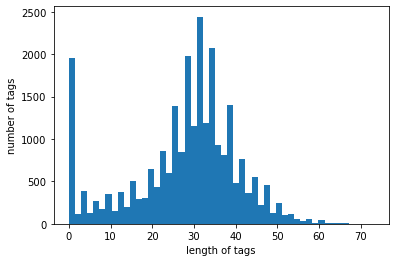

In [44]:
plt.hist(df1['str_tags_length'], bins=50)
plt.xlabel('length of tags')
plt.ylabel('number of tags')
plt.show()

In [45]:
len(df1.loc[df1['str_tags_length'] == 0])

1949

- tag가 붙지 않은 상품(길이가 0) => 12253
- tag가 붙지 않은 상품은 추천을 하기가 어려움
- tag가 붙지 않은 상품을 없앨까...?

#### coordi

In [46]:
df1.coordi.isnull().sum()

10545

In [48]:
no_coordi_tags = df1[(df1['str_tags_length'] == 0) | (df1['coordi'] == None)]
no_coordi_tags.head()

,Unnamed: 0,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,...,age19_23,age24_28,age29_33,age34_39,age40,man,woman,img,str_tags,str_tags_length
78,78,스몰 트위치로고 나일론 백팩 차콜,가방,백팩,LEE,LE2201BG23CH,[],"59,000원",4.8,154.0,...,29%,25%,11%,5%,4%,22%,78%,https://image.msscdn.net/images/goods_img/2022...,,0
97,97,트레블 백팩 / 블랙,가방,백팩,NEIKIDNIS,015TRB04,[],"64,000원",4.8,946.0,...,18%,17%,5%,2%,8%,29%,71%,https://image.msscdn.net/images/goods_img/2016...,,0
115,115,마론 백팩 M 블랙 DQ209002,가방,백팩,SAMSONITE RED,DQ209002,[],"158,000원",4.8,194.0,...,11%,27%,13%,5%,5%,69%,31%,https://image.msscdn.net/images/goods_img/2019...,,0
116,116,[NF] 체인 레더 버킷 백팩 (블랙)_F21QF003,여성 가방,백팩,NASTY FANCY CLUB,F21QF003BK,[],"65,000원",4.7,237.0,...,47%,20%,4%,1%,4%,3%,97%,https://image.msscdn.net/images/goods_img/2021...,,0
120,120,[UNISEX][폴라] 베이지 가죽 스트랩 로고 남녀공용 백팩 JLBA2E712I2,가방,백팩,JILL BY JILLSTUART,JLBA2E712I2,[],"108,000원",4.9,537.0,...,29%,20%,7%,4%,7%,19%,81%,https://image.msscdn.net/images/goods_img/2021...,,0


In [49]:
len(no_coordi_tags)

1949

In [50]:
def coordi_processing(x):
    try :
        return literal_eval(x)
        
    except :
        return []

In [51]:
temp1 = df1.coordi.apply(lambda x : coordi_processing(x))
temp1

0        [스트릿, 스포츠, 캐주얼]
1                  [캐주얼]
2                  [캐주얼]
3                  [캐주얼]
4                  [캐주얼]
              ...       
65546              [캐주얼]
65547              [캐주얼]
65548              [캐주얼]
65549                 []
65550              [스트릿]
Name: coordi, Length: 25622, dtype: object

In [52]:
len_temp = [len(sample) for sample in temp1]

In [53]:
df1['coordi_length'] = len_temp

In [54]:
df1.coordi_length.describe()

count    25622.000000
mean         0.841855
std          0.852293
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          5.000000
Name: coordi_length, dtype: float64

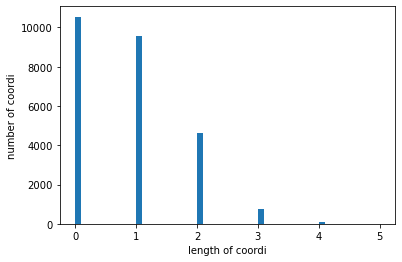

In [55]:
plt.hist(df1['coordi_length'] , bins=50)
plt.xlabel('length of coordi')
plt.ylabel('number of coordi')
plt.show()

In [56]:
len(df1[(df1['coordi_length'] == 0)])

10545

In [57]:
no_coordi_tags = df1[(df1['str_tags_length'] == 0) | (df1['coordi_length'] == 0)]
no_coordi_tags.head()

,Unnamed: 0,name,main_category,sub_category,brand,number,tags,price,rating,rating_num,...,age24_28,age29_33,age34_39,age40,man,woman,img,str_tags,str_tags_length,coordi_length
24,24,CARRY BACKPACK - BLACK,여성 가방,백팩,DRIFE,DIZKZAD2BKF,"[가방, 백팩, 스카치, 스트링백팩]","98,000원",4.8,2516.0,...,20%,7%,2%,8%,28%,72%,https://image.msscdn.net/images/goods_img/2018...,가방 백팩 스카치 스트링백팩,15,0
27,27,[슈펜X마하그리드] 스트링 백팩 TPBK78S74,가방,백팩,SHOOPEN,744609,"[신학기가방, 로고플레이, 백팩추천, 학생가방, 슈펜X마하그리드, 슈펜콜라보레이션,...","49,900원",4.9,352.0,...,16%,5%,2%,8%,37%,63%,https://image.msscdn.net/images/goods_img/2021...,신학기가방 로고플레이 백팩추천 학생가방 슈펜X마하그리드 슈펜콜라보레이션 슈펜×마하그리드,48,0
33,33,ARCHITECT PACK ( + IPAD POUCH ) 37L,가방,백팩,YALE,YC1BG0021BK,"[백팩, 캐주얼, 학생가방, 백팩추천, 가방추천]","129,000원",4.9,242.0,...,17%,6%,1%,8%,42%,58%,https://image.msscdn.net/images/goods_img/2022...,백팩 캐주얼 학생가방 백팩추천 가방추천,21,0
41,41,N194ABG350 패딩 백팩 BLACK,가방,백팩,NATIONALGEOGRAPHIC,1122769,[패딩슈즈/패딩백팩],"89,000원",4.7,84.0,...,17%,11%,7%,16%,59%,41%,https://image.msscdn.net/images/goods_img/2019...,패딩슈즈/패딩백팩,9,0
42,42,레가시 스탠다드 워크 백팩 4컬러,여성 가방,백팩,CARHARTT,908,"[백팩, 칼하트가방, 칼하트레가시백팩, 칼하트백, 칼하트백팩, 칼하트스탠다드백팩, ...","149,000원",4.8,331.0,...,16%,6%,3%,8%,27%,73%,https://image.msscdn.net/images/goods_img/2019...,백팩 칼하트가방 칼하트레가시백팩 칼하트백 칼하트백팩 칼하트스탠다드백팩 칼하트스탠다드워크팩,49,0


In [58]:
len(no_coordi_tags)

11540

In [59]:
len(df1[(df1['str_tags_length'] == 0) & (df1['coordi_length'] == 0)])

954

- 코디 태그가 달려 있지 않은 것을 날리게 되면 많은 부분이 날라갈 수 있음

In [ ]:
df1.tags.isnull().sum()
# '[]' 이라고 되어 있는 것들이 결측치가 아닌 것으로 되어 있다.

In [5]:
df1.tags.isnull().sum()

0

In [7]:
type(df1.tags[0])

list

In [ ]:
df1.loc[(df1['tags'] == [])]

In [ ]:
df1.tags.value_counts()

In [ ]:
temp = copy_df.tags.apply(lambda x : " ".join(literal_eval(x)))

In [ ]:
total_count = len(df.index)
total_genres = list(set([genre for sublist in list(map(lambda x: x.split('|'), df['tags'])) for genre in sublist]))